This is my first reinforcement learning project using Tensorflow. The goal of the project is to create a simulated environment that behaves similarly to a minigame in Command & Conquer Generals Zero Hour.
The minigame is humvee micro, which consists of a map, one humvee unit for the player, and multiple quad cannons on the enemy side. To make the job of the AI simple we emit as much useless data from the input layer as possible, here are the paremeters I have chosen:
Inputs:
<ul>
<li>X and Y distance from closest Quad Cannon (2 neurons float32)</li>
<li>Distance from each side of the map (4 neurons float32)</li>
</ul>
<ul>
Outputs:
<li>Direction (~8 direction, 1 stay still)</li>
</ul>
The map will be represented in the range [0, 1], to prevent the network from exploding

In [2]:
from typing import List, Tuple

import numpy as np

import pygame
import math
import time
import random

import tensorflow as tf
keras = tf.keras

tf.compat.v1.disable_eager_execution()

from game import Game

In [3]:
from keras.models import load_model

game = Game(render=True, render_interval=1, limit_fps=True)
model = load_model('humvee_largest_20.h5')

while game.running:
    state = np.array([game.get_state()])
    actions = model.predict(state)[0]
    print(actions)
    action = np.argmax(actions)

    game.step(action)
    if (game.done):
        game.reset()
    
pygame.quit()

OSError: No file or directory found at humvee_largest_20.h5

Next we need to implement the deep Q learning algorithm. We will use a replay buffer, and a Sequential keras neural network.

Let's start with the replay buffer

In [4]:
# Define the replay buffer
class ReplayBuffer():
    def __init__(self, max_size, input_dims):
        self.mem_size = max_size # How many states we keep track of
        self.mem_cntr = 0 # How many times added a new state

        # Initialize the state memory. The *input_dims expression pulls out the
        # dimention values ex.: (5,  *(1, 4, 3)) = (5, 1, 4, 3)
        self.state_memory = np.zeros((self.mem_size, *input_dims),
                                dtype=np.float32)

        self.new_state_memory = np.zeros((self.mem_size, *input_dims),
                                dtype=np.float32)
        
        self.action_memory = np.zeros(self.mem_size, dtype=np.int32) # The action taken on that state
        self.reward_memory = np.zeros(self.mem_size, dtype=np.float32) # The reward received in the state
        self.terminal_memory = np.zeros(self.mem_size, dtype=np.int32) # 0 if the game was still going, 1 if it ended

    def store_transition(self, state, action, reward, state_, done):
        index = self.mem_cntr % self.mem_size

        self.state_memory[index] = state
        self.action_memory[index] = action
        self.reward_memory[index] = reward
        self.new_state_memory[index] = state_
        self.terminal_memory[index] = 1 - int(done)
        self.mem_cntr += 1
    
    def sample_buffer(self, batch_size):
        max_mem = min(self.mem_cntr, self.mem_size)

        # Selects batch_size number of indexes from the memory
        batch_indexes = np.random.choice(max_mem, batch_size, replace=False)

        states = self.state_memory[batch_indexes]
        states_ = self.new_state_memory[batch_indexes]
        rewards = self.reward_memory[batch_indexes]
        actions = self.action_memory[batch_indexes]
        terminal = self.terminal_memory[batch_indexes]

        return states, actions, rewards, states_, terminal

Next we define the neural network structure

In [5]:
from tensorflow import keras

def create_dqn(lr, n_actions, input_dims, fc1_dims, fc2_dims):
    model = keras.Sequential([
        keras.layers.Dense(fc1_dims, activation='relu'),
        keras.layers.Dense(fc2_dims, activation='relu'),
        keras.layers.Dense(n_actions)
    ])
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=lr),
                  loss='mse')
    
    return model

In [6]:
from keras.models import load_model

class Agent():
    def __init__(self, lr, gamma, n_actions, epsilon, batch_size,
                 input_dims, epsilon_dec=0.0001, epsilon_end=0.01,
                 mem_size=1000000, fname='sqn_model.h5'):
        self.action_space = [i for i in range(n_actions)]
        self.gamma = gamma
        self.epsilon = epsilon
        self.eps_min = epsilon_end
        self.eps_dec = epsilon_dec
        self.batch_size = batch_size
        self.model_file = fname
        self.memory = ReplayBuffer(mem_size, input_dims=input_dims)
        self.q_eval = create_dqn(lr, n_actions, input_dims, 256, 256)

    def store_transition(self, state, action, reward, new_state, done):
        self.memory.store_transition(state, action, reward, new_state, done)

    def choose_action(self, observation):
        if np.random.random() < self.epsilon:
            action = np.random.choice(self.action_space)
        else:
            state = np.array([observation])
            actions = self.q_eval.predict(state)

            action = np.argmax(actions)

        return action
    
    def learn(self):
        if self.memory.mem_cntr < self.batch_size:
            return
        
        states, actions, rewards, states_, dones = \
                self.memory.sample_buffer(self.batch_size)
        
        q_eval = self.q_eval.predict(states)
        q_next = self.q_eval.predict(states_)

        q_target = np.copy(q_eval)
        batch_index = np.arange(self.batch_size, dtype=np.int32)

        q_target[batch_index, actions] = rewards + \
            self.gamma * np.max(q_next, axis=1) * (1 - dones)

        
        self.q_eval.train_on_batch(states, q_target)

        # Epsilon decay
        self.epsilon = self.epsilon - self.eps_dec if self.epsilon > \
                        self.eps_min else self.eps_min
        
    def save_model(self):
        self.q_eval.save(self.model_file)

    def load_model(self):
        self.q_eval = load_model(self.model_file)

        

Next we test out the algoritm on OpenAI gym

In [7]:
import matplotlib.pyplot as plt

def plotLearning(x, scores, epsilons, filename, lines=None):
    fig=plt.figure()
    ax=fig.add_subplot(111, label='1')
    ax2=fig.add_subplot(111, label="2", frame_on=False)

    ax.plot(x, epsilons, color='C0')
    ax.set_xlabel('Game', color='C0')
    ax.set_ylabel('Epsilon', color='C0')
    ax.tick_params(axis='x', colors='C0')
    ax.tick_params(axis='y', colors='C0')

    N = len(scores)
    running_avg = np.empty(N)
    for t in range(N):
        running_avg[t] = np.mean(scores[max(0, t-20):(t+1)])

    ax2.scatter(x, running_avg, color='C1')
    ax2.axes.get_xaxis().set_visible(False)
    ax2.yaxis.tick_right()
    ax2.set_ylabel('Score', color='C1')
    ax2.yaxis.set_label_position('right')
    ax2.tick_params(axis='y', colors='C1')

    if lines is not None:
        for line in lines:
            plt.axvline(x=line)

    plt.savefig(filename)

ImportError: Matplotlib requires numpy>=1.23; you have 1.21.6

Let' try the gym LunarLander-v2 environment!

In [8]:
import tensorflow as tf
import gym

if __name__ == '__main__':
    tf.compat.v1.disable_eager_execution()
    env = gym.make('LunarLander-v2')
    lr = 0.001
    n_games = 500
    agent = Agent(gamma=0.99, epsilon=1.0, lr=lr,
                  input_dims=env.observation_space.shape,
                  n_actions=env.action_space.n, mem_size=1000000, batch_size=64,
                  epsilon_end=0.01)
    scores = []
    eps_history = []

    for i in range(n_games):
        done = False
        score = 0
        observation, info = env.reset()
        while not done:
            action = agent.choose_action(observation)
            observation_, reward, done, truncated, info = env.step(action)
            score += reward
            agent.store_transition(observation, action, reward, observation_, done)
            observation = observation_
            agent.learn()
        eps_history.append(agent.epsilon)
        scores.append(score)

        avg_score = np.mean(scores[-100:])
        print('episode: ', i, 'score %.2f' % score,
              'avarage_score %.02f' % avg_score,
              'epsilon %.2f' % agent.epsilon)
        
    filename = 'lunarlander_tf2.png'
    x = [i+1 for i in range(n_games)]
    plotLearning(x, scores, eps_history, filename)

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):
c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


episode:  0 score -72.99 avarage_score -72.99 epsilon 1.00
episode:  1 score -108.84 avarage_score -90.92 epsilon 0.99
episode:  2 score -151.26 avarage_score -111.03 epsilon 0.99
episode:  3 score -76.45 avarage_score -102.39 epsilon 0.98
episode:  4 score -102.11 avarage_score -102.33 epsilon 0.97


KeyboardInterrupt: 

Now let's try to hook up the humvee micro simulation

In [4]:
from tensorflow import keras

def create_humvee_dqn(lr, n_actions):
    model = keras.Sequential([
        keras.layers.Dense(500, activation='relu'),
        keras.layers.Dense(500, activation='relu'),
        keras.layers.Dense(500, activation='relu'),
        keras.layers.Dense(500, activation='relu'),
        keras.layers.Dense(n_actions)
    ])
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=lr),
                  loss='mse')
    
    return model

In [5]:
# Define the replay buffer
class HumveeReplayBuffer():
    def __init__(self, max_size, input_dims):
        self.mem_size = max_size # How many states we keep track of
        self.mem_cntr = 0 # How many times added a new state

        # Initialize the state memory. The *input_dims expression pulls out the
        # dimention values ex.: (5,  *(1, 4, 3)) = (5, 1, 4, 3)
        self.state_memory = np.zeros((self.mem_size, *input_dims),
                                dtype=np.float32)

        self.new_state_memory = np.zeros((self.mem_size, *input_dims),
                                dtype=np.float32)
        
        self.action_memory = np.zeros(self.mem_size, dtype=np.int32) # The action taken on that state
        self.reward_memory = np.zeros(self.mem_size, dtype=np.float32) # The reward received in the state
        self.terminal_memory = np.zeros(self.mem_size, dtype=np.int32) # 0 if the game was still going, 1 if it ended

    def store_transition(self, state, action, reward, state_, done):
        index = self.mem_cntr % self.mem_size

        self.state_memory[index] = state
        self.action_memory[index] = action
        self.reward_memory[index] = reward
        self.new_state_memory[index] = state_
        self.terminal_memory[index] = 1 - int(done)
        self.mem_cntr += 1
    
    def sample_buffer(self, batch_size):
        max_mem = min(self.mem_cntr, self.mem_size)

        # Selects batch_size number of indexes from the memory
        batch_indexes = np.random.choice(max_mem, batch_size, replace=False)

        states = self.state_memory[batch_indexes]
        states_ = self.new_state_memory[batch_indexes]
        rewards = self.reward_memory[batch_indexes]
        actions = self.action_memory[batch_indexes]
        terminal = self.terminal_memory[batch_indexes]

        return states, actions, rewards, states_, terminal

In [6]:
from keras.models import load_model

class HumveeAgent():
    def __init__(self, lr, gamma, n_actions, epsilon, batch_size,
                 input_dims, epsilon_dec=0.0001, epsilon_end=0.01,
                 mem_size=1000000, fname='sqn_model.h5'):
        self.action_space = [i for i in range(n_actions)]
        self.gamma = gamma
        self.epsilon = epsilon
        self.eps_min = epsilon_end
        self.eps_dec = epsilon_dec
        self.batch_size = batch_size
        self.model_file = fname
        self.memory = HumveeReplayBuffer(mem_size, input_dims=input_dims)
        self.q_eval = create_humvee_dqn(lr, n_actions)

    def store_transition(self, state, action, reward, new_state, done):
        self.memory.store_transition(state, action, reward, new_state, done)

    def choose_action(self, observation):
        if np.random.random() < self.epsilon:
            action = np.random.choice(self.action_space)
        else:
            state = np.array([observation])
            actions = self.q_eval.predict(state)

            action = np.argmax(actions)

        return action
        
    def learn(self):
        if self.memory.mem_cntr < self.batch_size:
            return
        
        states, actions, rewards, states_, dones = \
                self.memory.sample_buffer(self.batch_size)
        
        q_eval = self.q_eval.predict(states)
        q_next = self.q_eval.predict(states_)

        q_target = np.copy(q_eval)
        batch_index = np.arange(self.batch_size, dtype=np.int32)

        q_target[batch_index, actions] = rewards + \
            self.gamma * np.max(q_next, axis=1) * (1 - dones)

        
        self.q_eval.train_on_batch(states, q_target)

        # Epsilon decay
        self.epsilon = self.epsilon - self.eps_dec if self.epsilon > \
                        self.eps_min else self.eps_min
        
    def save_model(self, append=''):
        self.q_eval.save(self.model_file + append + '.h5')

    def load_model(self, path):
        self.q_eval = load_model(path)

        

In [26]:
import tensorflow as tf

def train_model(model, prev_model=None):
    env = Game(render=True, render_interval=10)
    lr = 0.001
    n_games = 10000
    CHECKPOINT_INTERVAL = 1000

    agent = HumveeAgent(gamma=0.99, epsilon=0.05, lr=lr,
                input_dims=env.get_state().shape,
                n_actions=env.n_actions, mem_size=1000000, batch_size=64,
                epsilon_end=0.05, fname=model)
    if (prev_model):
        agent.load_model(prev_model)
    
    scores = []
    eps_history = []

    for i in range(n_games):
        done = False
        score = 0
        observation, info = env.reset()
        while not done:
            action = agent.choose_action(observation)
            observation_, reward, done, truncated, info = env.step(action)
            score += reward
            agent.store_transition(observation, action, reward, observation_, done)
            observation = observation_
            agent.learn()
        eps_history.append(agent.epsilon)
        scores.append(score)

        avg_score = np.mean(scores[-100:])
        print('episode: ', i, 'score %.2f' % score,
              'avarage_score %.02f' % avg_score,
              'epsilon %.2f' % agent.epsilon)
        
        if i != 0 and i % CHECKPOINT_INTERVAL == 0:
            filename = model+'_checkpoint'+str(i/CHECKPOINT_INTERVAL)+'.png'
            x = [a+1 for a in range(i+1)]
            agent.save_model('_checkpoint_'+str(i/CHECKPOINT_INTERVAL))
            plotLearning(x, scores, eps_history, filename)
        
    filename = model+'.png'
    x = [i+1 for i in range(n_games)]
    plotLearning(x, scores, eps_history, filename)

    return agent

episode:  0 score 36.00 avarage_score 36.00 epsilon 1.00
episode:  1 score 35.00 avarage_score 35.50 epsilon 0.99
episode:  2 score 52.00 avarage_score 41.00 epsilon 0.99
episode:  3 score 59.00 avarage_score 45.50 epsilon 0.98
episode:  4 score 101.00 avarage_score 56.60 epsilon 0.98
episode:  5 score 38.00 avarage_score 53.50 epsilon 0.97
episode:  6 score 42.00 avarage_score 51.86 epsilon 0.97
episode:  7 score 27.00 avarage_score 48.75 epsilon 0.96
episode:  8 score 26.00 avarage_score 46.22 epsilon 0.96
episode:  9 score 42.00 avarage_score 45.80 epsilon 0.95
episode:  10 score 88.00 avarage_score 49.64 epsilon 0.94
episode:  11 score 48.00 avarage_score 49.50 epsilon 0.94
episode:  12 score 3.00 avarage_score 45.92 epsilon 0.93
episode:  13 score 56.00 avarage_score 46.64 epsilon 0.93
episode:  14 score 51.00 avarage_score 46.93 epsilon 0.92
episode:  15 score 58.00 avarage_score 47.62 epsilon 0.92
episode:  16 score 43.00 avarage_score 47.35 epsilon 0.91
episode:  17 score 50.00

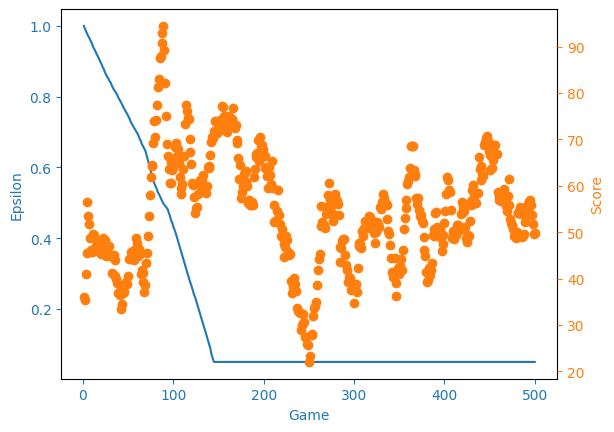

In [63]:
agent = train_model('humvee_3.h5', 'humvee_2.h5')
agent.save_model()

It seems 512,512,512 structure doesn't work! Let's try increasing the learning rate, maybe it will fix it! 0.001 -> 0.01

episode:  0 score 48.00 avarage_score 48.00 epsilon 1.00


c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


episode:  1 score 62.00 avarage_score 55.00 epsilon 0.99
episode:  2 score 51.00 avarage_score 53.67 epsilon 0.99
episode:  3 score 108.00 avarage_score 67.25 epsilon 0.98
episode:  4 score 50.00 avarage_score 63.80 epsilon 0.98
episode:  5 score 32.00 avarage_score 58.50 epsilon 0.97
episode:  6 score 100.00 avarage_score 64.43 epsilon 0.96
episode:  7 score 30.00 avarage_score 60.12 epsilon 0.96
episode:  8 score 112.00 avarage_score 65.89 epsilon 0.95
episode:  9 score 47.00 avarage_score 64.00 epsilon 0.95
episode:  10 score 98.00 avarage_score 67.09 epsilon 0.94
episode:  11 score 55.00 avarage_score 66.08 epsilon 0.93
episode:  12 score 15.00 avarage_score 62.15 epsilon 0.93
episode:  13 score 7.00 avarage_score 58.21 epsilon 0.92
episode:  14 score 29.00 avarage_score 56.27 epsilon 0.92
episode:  15 score 27.00 avarage_score 54.44 epsilon 0.91
episode:  16 score 51.00 avarage_score 54.24 epsilon 0.91
episode:  17 score -12.00 avarage_score 50.56 epsilon 0.90
episode:  18 score 9

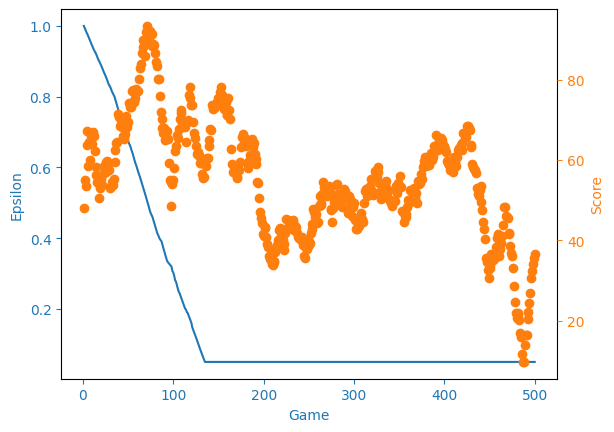

In [65]:
agent = train_model('humvee_4.h5', 'humvee_2.h5')
agent.save_model()

Ouch! Incresing the learning rate definately did not help. Let's try decreasing it! 0.01 -> 0.00005

episode:  0 score 94.00 avarage_score 94.00 epsilon 1.00
episode:  1 score 29.00 avarage_score 61.50 epsilon 1.00
episode:  2 score 17.00 avarage_score 46.67 epsilon 0.99
episode:  3 score 5.00 avarage_score 36.25 epsilon 0.98
episode:  4 score 32.00 avarage_score 35.40 epsilon 0.98
episode:  5 score 26.00 avarage_score 33.83 epsilon 0.97
episode:  6 score 46.00 avarage_score 35.57 epsilon 0.97
episode:  7 score 95.00 avarage_score 43.00 epsilon 0.96
episode:  8 score 22.00 avarage_score 40.67 epsilon 0.95
episode:  9 score 16.00 avarage_score 38.20 epsilon 0.95
episode:  10 score 49.00 avarage_score 39.18 epsilon 0.94
episode:  11 score 79.00 avarage_score 42.50 epsilon 0.94
episode:  12 score 99.00 avarage_score 46.85 epsilon 0.93
episode:  13 score 11.00 avarage_score 44.29 epsilon 0.93
episode:  14 score 25.00 avarage_score 43.00 epsilon 0.92
episode:  15 score 108.00 avarage_score 47.06 epsilon 0.91
episode:  16 score 34.00 avarage_score 46.29 epsilon 0.91
episode:  17 score 16.00

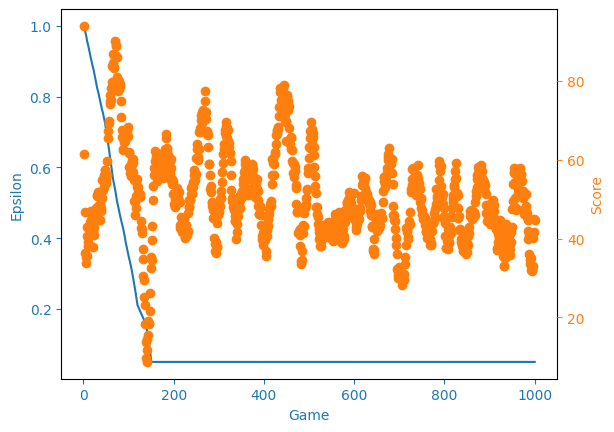

In [71]:
agent = train_model('humvee_5.h5', 'humvee_2.h5')
agent.save_model()

Eh results... next! LR: 0.0001

episode:  0 score 63.00 avarage_score 63.00 epsilon 1.00
episode:  1 score 105.00 avarage_score 84.00 epsilon 0.99
episode:  2 score 23.00 avarage_score 63.67 epsilon 0.99
episode:  3 score 11.00 avarage_score 50.50 epsilon 0.98
episode:  4 score 107.00 avarage_score 61.80 epsilon 0.98
episode:  5 score -1.00 avarage_score 51.33 epsilon 0.97
episode:  6 score 58.00 avarage_score 52.29 epsilon 0.96
episode:  7 score 46.00 avarage_score 51.50 epsilon 0.96
episode:  8 score -6.00 avarage_score 45.11 epsilon 0.95
episode:  9 score 103.00 avarage_score 50.90 epsilon 0.95
episode:  10 score 24.00 avarage_score 48.45 epsilon 0.94
episode:  11 score 28.00 avarage_score 46.75 epsilon 0.93
episode:  12 score 79.00 avarage_score 49.23 epsilon 0.93
episode:  13 score 9.00 avarage_score 46.36 epsilon 0.92
episode:  14 score 12.00 avarage_score 44.07 epsilon 0.92
episode:  15 score 39.00 avarage_score 43.75 epsilon 0.91
episode:  16 score 6.00 avarage_score 41.53 epsilon 0.91
episode:  17 score 33.0

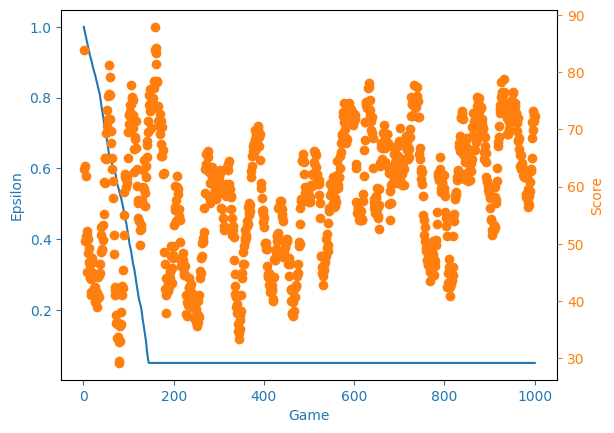

In [73]:
agent = train_model('humvee_6.h5', 'humvee_2.h5')
agent.save_model()

Decent results actually, let's keep training it!

episode:  0 score 28.00 avarage_score 28.00 epsilon 1.00


c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


episode:  1 score 114.00 avarage_score 71.00 epsilon 0.99
episode:  2 score 54.00 avarage_score 65.33 epsilon 0.99
episode:  3 score 36.00 avarage_score 58.00 epsilon 0.98
episode:  4 score 13.00 avarage_score 49.00 epsilon 0.97
episode:  5 score 24.00 avarage_score 44.83 epsilon 0.97
episode:  6 score 3.00 avarage_score 38.86 epsilon 0.96
episode:  7 score 41.00 avarage_score 39.12 epsilon 0.96
episode:  8 score 35.00 avarage_score 38.67 epsilon 0.95
episode:  9 score 34.00 avarage_score 38.20 epsilon 0.95
episode:  10 score 35.00 avarage_score 37.91 epsilon 0.94
episode:  11 score 25.00 avarage_score 36.83 epsilon 0.94
episode:  12 score 62.00 avarage_score 38.77 epsilon 0.93
episode:  13 score 12.00 avarage_score 36.86 epsilon 0.93
episode:  14 score 31.00 avarage_score 36.47 epsilon 0.92
episode:  15 score 117.00 avarage_score 41.50 epsilon 0.91
episode:  16 score 11.00 avarage_score 39.71 epsilon 0.91
episode:  17 score 46.00 avarage_score 40.06 epsilon 0.90
episode:  18 score 25.

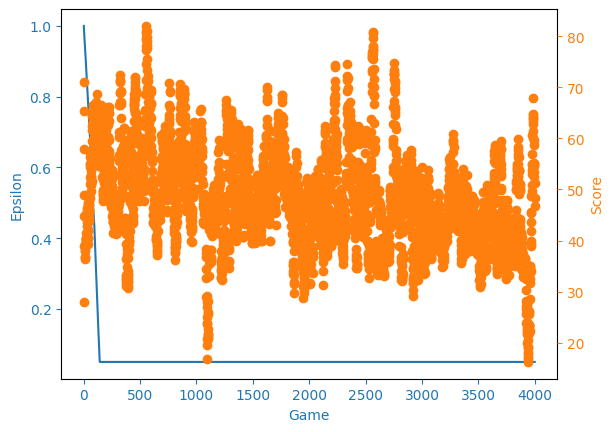

In [15]:
agent = train_model('humvee_7.h5', 'humvee_6.h5')
agent.save_model()

Maybe the network needs less sparse rewards... Let's give a reward for shooting at a quad, and a negative reward for getting shot
I also put the network back to simple mode.. why it's not working???

episode:  0 score -594.00 avarage_score -594.00 epsilon 1.00
episode:  1 score 10.00 avarage_score -292.00 epsilon 0.99
episode:  2 score -798.00 avarage_score -460.67 epsilon 0.99
episode:  3 score -788.00 avarage_score -542.50 epsilon 0.98
episode:  4 score -475.00 avarage_score -529.00 epsilon 0.98
episode:  5 score -196.00 avarage_score -473.50 epsilon 0.97
episode:  6 score -467.00 avarage_score -472.57 epsilon 0.97
episode:  7 score -1157.00 avarage_score -558.12 epsilon 0.96
episode:  8 score -80.00 avarage_score -505.00 epsilon 0.96
episode:  9 score -661.00 avarage_score -520.60 epsilon 0.95
episode:  10 score -455.00 avarage_score -514.64 epsilon 0.94
episode:  11 score -576.00 avarage_score -519.75 epsilon 0.94
episode:  12 score -832.00 avarage_score -543.77 epsilon 0.93
episode:  13 score -1017.00 avarage_score -577.57 epsilon 0.93
episode:  14 score -979.00 avarage_score -604.33 epsilon 0.92
episode:  15 score 78.00 avarage_score -561.69 epsilon 0.92
episode:  16 score -2

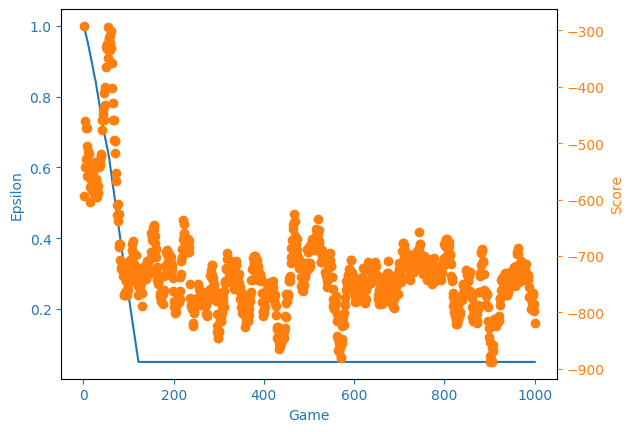

In [21]:
agent = train_model('humvee_8.h5', 'humvee_7.h5')
agent.save_model()

Let's try again, I set the loss to MAE, and started the new model from scratch instead of continuing model 7. I also ran the code to set the network to be smaller again, in case I didn't do that last time by accident

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


episode:  0 score -867.00 avarage_score -867.00 epsilon 1.00
episode:  1 score -989.00 avarage_score -928.00 epsilon 0.99
episode:  2 score -886.00 avarage_score -914.00 epsilon 0.99
episode:  3 score -927.00 avarage_score -917.25 epsilon 0.98
episode:  4 score -678.00 avarage_score -869.40 epsilon 0.98
episode:  5 score -59.00 avarage_score -734.33 epsilon 0.97
episode:  6 score -1148.00 avarage_score -793.43 epsilon 0.96
episode:  7 score 159.00 avarage_score -674.38 epsilon 0.96
episode:  8 score -943.00 avarage_score -704.22 epsilon 0.95
episode:  9 score -631.00 avarage_score -696.90 epsilon 0.95
episode:  10 score -677.00 avarage_score -695.09 epsilon 0.94
episode:  11 score -113.00 avarage_score -646.58 epsilon 0.93
episode:  12 score -484.00 avarage_score -634.08 epsilon 0.93
episode:  13 score -948.00 avarage_score -656.50 epsilon 0.93
episode:  14 score -827.00 avarage_score -667.87 epsilon 0.92
episode:  15 score -694.00 avarage_score -669.50 epsilon 0.92
episode:  16 score 

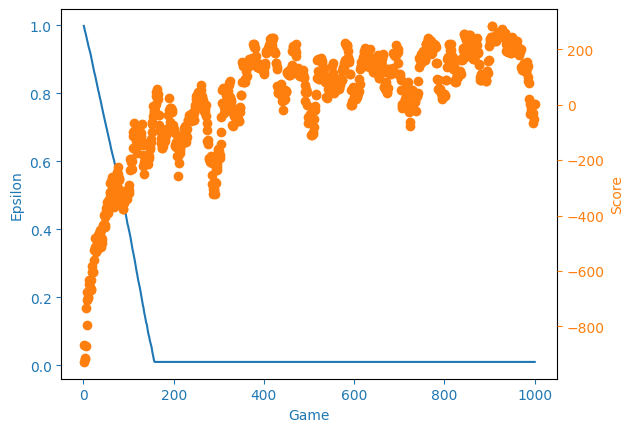

In [28]:
agent = train_model('humvee_9.h5')
agent.save_model()

Looks like it's working.. Let's keep training it!

episode:  0 score -1090.00 avarage_score -1090.00 epsilon 1.00
episode:  1 score -758.00 avarage_score -924.00 epsilon 0.99
episode:  2 score -596.00 avarage_score -814.67 epsilon 0.99
episode:  3 score -956.00 avarage_score -850.00 epsilon 0.98
episode:  4 score -497.00 avarage_score -779.40 epsilon 0.98
episode:  5 score -1121.00 avarage_score -836.33 epsilon 0.97
episode:  6 score -616.00 avarage_score -804.86 epsilon 0.97
episode:  7 score -470.00 avarage_score -763.00 epsilon 0.96
episode:  8 score -510.00 avarage_score -734.89 epsilon 0.96
episode:  9 score -1027.00 avarage_score -764.10 epsilon 0.95
episode:  10 score -629.00 avarage_score -751.82 epsilon 0.95
episode:  11 score -508.00 avarage_score -731.50 epsilon 0.94
episode:  12 score -687.00 avarage_score -728.08 epsilon 0.93
episode:  13 score -1142.00 avarage_score -757.64 epsilon 0.93
episode:  14 score -564.00 avarage_score -744.73 epsilon 0.92
episode:  15 score -960.00 avarage_score -758.19 epsilon 0.91
episode:  16 

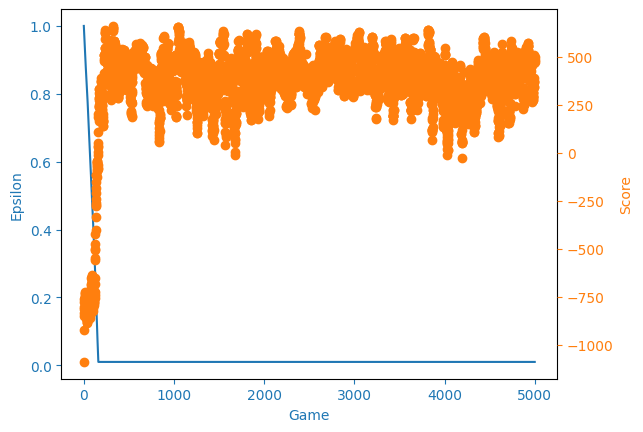

: 

In [34]:
agent = train_model('humvee_10.h5', 'humvee_9.h5')
agent.save_model()

It's actually doing great! Let's test it in the actual game! I have made a test map for it, I just need a button to start the algorithm, get the map every frame, extract each color, get the input data for the neural network, run the neural network, then use the result to click on the minimap!

We ran it in game, and we got roasted by this autistic retard in swr, but at least we know some new information.
-The quads need a larger move away area
-The humvees need a smaller attack range (or change the map attack range for now)
-Add a turning delay to the humvee movement

episode:  0 score -443.00 avarage_score -443.00 epsilon 1.00
episode:  1 score -789.00 avarage_score -616.00 epsilon 0.99
episode:  2 score -942.00 avarage_score -724.67 epsilon 0.99
episode:  3 score -812.00 avarage_score -746.50 epsilon 0.98
episode:  4 score -684.00 avarage_score -734.00 epsilon 0.98
episode:  5 score -1038.00 avarage_score -784.67 epsilon 0.97
episode:  6 score -273.00 avarage_score -711.57 epsilon 0.96
episode:  7 score -912.00 avarage_score -736.62 epsilon 0.96
episode:  8 score -541.00 avarage_score -714.89 epsilon 0.95
episode:  9 score -370.00 avarage_score -680.40 epsilon 0.94
episode:  10 score -812.00 avarage_score -692.36 epsilon 0.94
episode:  11 score -470.00 avarage_score -673.83 epsilon 0.93
episode:  12 score -688.00 avarage_score -674.92 epsilon 0.92
episode:  13 score -580.00 avarage_score -668.14 epsilon 0.92
episode:  14 score -427.00 avarage_score -652.07 epsilon 0.91
episode:  15 score -862.00 avarage_score -665.19 epsilon 0.90
episode:  16 scor

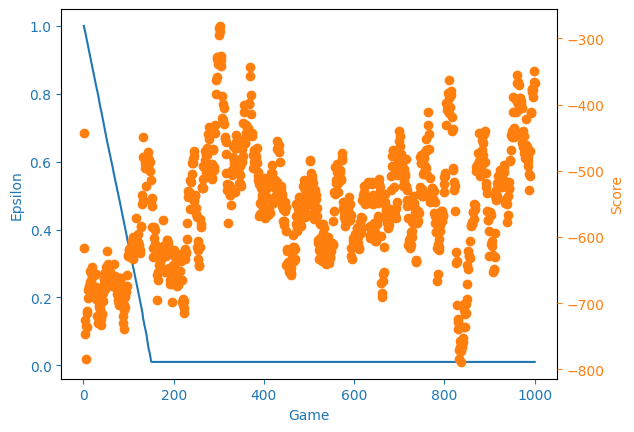

In [26]:
agent = train_model('humvee_11.h5', 'humvee_10.h5')
agent.save_model()

episode:  0 score -557.00 avarage_score -557.00 epsilon 1.00
episode:  1 score -541.00 avarage_score -549.00 epsilon 0.99
episode:  2 score -952.00 avarage_score -683.33 epsilon 0.99
episode:  3 score -914.00 avarage_score -741.00 epsilon 0.98
episode:  4 score -961.00 avarage_score -785.00 epsilon 0.98
episode:  5 score -1056.00 avarage_score -830.17 epsilon 0.97
episode:  6 score -785.00 avarage_score -823.71 epsilon 0.96
episode:  7 score -879.00 avarage_score -830.62 epsilon 0.96
episode:  8 score -884.00 avarage_score -836.56 epsilon 0.95
episode:  9 score -991.00 avarage_score -852.00 epsilon 0.94
episode:  10 score -502.00 avarage_score -820.18 epsilon 0.94
episode:  11 score -305.00 avarage_score -777.25 epsilon 0.93
episode:  12 score -487.00 avarage_score -754.92 epsilon 0.92
episode:  13 score -533.00 avarage_score -739.07 epsilon 0.92
episode:  14 score -758.00 avarage_score -740.33 epsilon 0.91
episode:  15 score -914.00 avarage_score -751.19 epsilon 0.90
episode:  16 scor

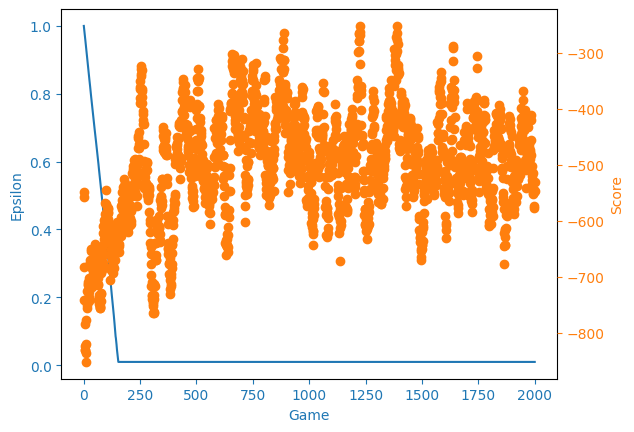

In [28]:
agent = train_model('humvee_12.h5', 'humvee_11.h5')
agent.save_model()

That was terrible, let's increase our turning speed and try again

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


episode:  0 score -249.00 avarage_score -249.00 epsilon 0.01
episode:  1 score 294.00 avarage_score 22.50 epsilon 0.01
episode:  2 score -627.00 avarage_score -194.00 epsilon 0.01
episode:  3 score 640.00 avarage_score 14.50 epsilon 0.01
episode:  4 score 685.00 avarage_score 148.60 epsilon 0.01
episode:  5 score -516.00 avarage_score 37.83 epsilon 0.01
episode:  6 score 643.00 avarage_score 124.29 epsilon 0.01
episode:  7 score -324.00 avarage_score 68.25 epsilon 0.01
episode:  8 score -864.00 avarage_score -35.33 epsilon 0.01
episode:  9 score 763.00 avarage_score 44.50 epsilon 0.01
episode:  10 score 457.00 avarage_score 82.00 epsilon 0.01
episode:  11 score 809.00 avarage_score 142.58 epsilon 0.01
episode:  12 score 691.00 avarage_score 184.77 epsilon 0.01
episode:  13 score 535.00 avarage_score 209.79 epsilon 0.01
episode:  14 score 668.00 avarage_score 240.33 epsilon 0.01
episode:  15 score -644.00 avarage_score 185.06 epsilon 0.01
episode:  16 score -363.00 avarage_score 152.82 

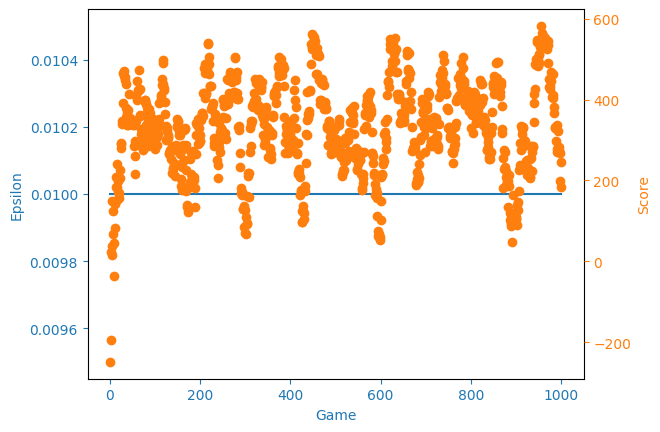

In [33]:
agent = train_model('humvee_13.h5', 'humvee_10.h5')
agent.save_model()

Did decent in the simulation, but in the game, the quads kill the humvee fast. The humvee needs to learn to avoid the quads.
I decided to increase the quad damage, lower their hitbox radius so they are closer together, increase the max time elapsed, and increase the reward for surviving.

episode:  0 score -115.00 avarage_score -115.00 epsilon 0.01
episode:  1 score 65.00 avarage_score -25.00 epsilon 0.01
episode:  2 score 340.00 avarage_score 96.67 epsilon 0.01
episode:  3 score -20.00 avarage_score 67.50 epsilon 0.01
episode:  4 score -185.00 avarage_score 17.00 epsilon 0.01
episode:  5 score 70.00 avarage_score 25.83 epsilon 0.01
episode:  6 score 360.00 avarage_score 73.57 epsilon 0.01
episode:  7 score -45.00 avarage_score 58.75 epsilon 0.01
episode:  8 score -265.00 avarage_score 22.78 epsilon 0.01
episode:  9 score -215.00 avarage_score -1.00 epsilon 0.01
episode:  10 score 80.00 avarage_score 6.36 epsilon 0.01
episode:  11 score -160.00 avarage_score -7.50 epsilon 0.01
episode:  12 score -315.00 avarage_score -31.15 epsilon 0.01
episode:  13 score -60.00 avarage_score -33.21 epsilon 0.01
episode:  14 score -300.00 avarage_score -51.00 epsilon 0.01
episode:  15 score 215.00 avarage_score -34.38 epsilon 0.01
episode:  16 score -60.00 avarage_score -35.88 epsilon 0

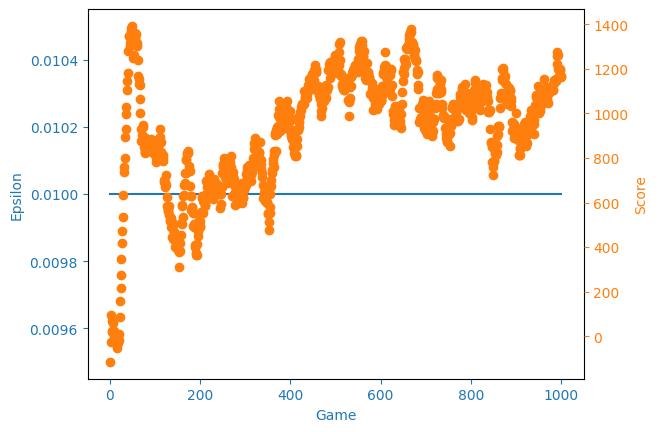

In [61]:
agent = train_model('humvee_14.h5', 'humvee_13.h5')
agent.save_model()

Okay, now let's nerf the damage of the humvee, so it learns to run away, add some extra speed, and lower the reward for staying close to the enemy to 10

episode:  0 score -270.00 avarage_score -270.00 epsilon 0.01
episode:  1 score 85.00 avarage_score -92.50 epsilon 0.01
episode:  2 score -145.00 avarage_score -110.00 epsilon 0.01
episode:  3 score -355.00 avarage_score -171.25 epsilon 0.01
episode:  4 score 15.00 avarage_score -134.00 epsilon 0.01
episode:  5 score 80.00 avarage_score -98.33 epsilon 0.01
episode:  6 score -320.00 avarage_score -130.00 epsilon 0.01
episode:  7 score -340.00 avarage_score -156.25 epsilon 0.01
episode:  8 score 0.00 avarage_score -138.89 epsilon 0.01
episode:  9 score -85.00 avarage_score -133.50 epsilon 0.01
episode:  10 score 40.00 avarage_score -117.73 epsilon 0.01
episode:  11 score 240.00 avarage_score -87.92 epsilon 0.01
episode:  12 score 190.00 avarage_score -66.54 epsilon 0.01
episode:  13 score 235.00 avarage_score -45.00 epsilon 0.01
episode:  14 score -715.00 avarage_score -89.67 epsilon 0.01
episode:  15 score -220.00 avarage_score -97.81 epsilon 0.01
episode:  16 score 265.00 avarage_score 

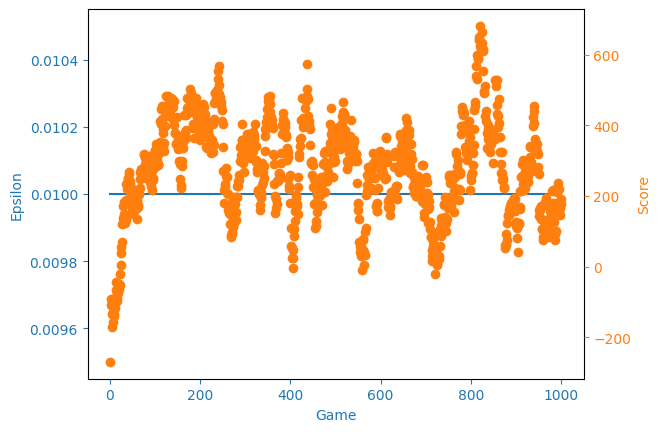

In [67]:
agent = train_model('humvee_15.h5', 'humvee_14.h5')
agent.save_model()

The algorithm seems to be working mostly, but keeps getting picked off from 1 shots of the quads. Let's increase the punishment for getting shot 

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


episode:  0 score -3540.00 avarage_score -3540.00 epsilon 0.01
episode:  1 score -4650.00 avarage_score -4095.00 epsilon 0.01
episode:  2 score -4280.00 avarage_score -4156.67 epsilon 0.01
episode:  3 score -4700.00 avarage_score -4292.50 epsilon 0.01
episode:  4 score -3620.00 avarage_score -4158.00 epsilon 0.01
episode:  5 score -6560.00 avarage_score -4558.33 epsilon 0.01
episode:  6 score -3420.00 avarage_score -4395.71 epsilon 0.01
episode:  7 score -4560.00 avarage_score -4416.25 epsilon 0.01
episode:  8 score -4710.00 avarage_score -4448.89 epsilon 0.01
episode:  9 score -5190.00 avarage_score -4523.00 epsilon 0.01
episode:  10 score -5490.00 avarage_score -4610.91 epsilon 0.01
episode:  11 score -4670.00 avarage_score -4615.83 epsilon 0.01
episode:  12 score -4390.00 avarage_score -4598.46 epsilon 0.01
episode:  13 score -4250.00 avarage_score -4573.57 epsilon 0.01
episode:  14 score -5240.00 avarage_score -4618.00 epsilon 0.01
episode:  15 score -4830.00 avarage_score -4631.25

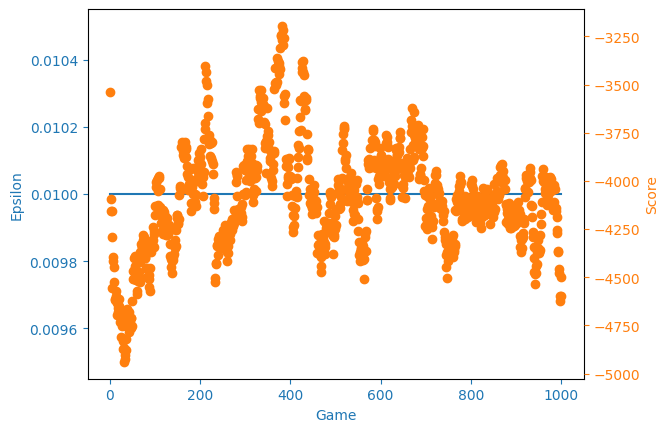

In [69]:
agent = train_model('humvee_16.h5', 'humvee_15.h5')
agent.save_model()

Humvee died
Humvee died
Humvee died
episode:  0 score -3570.00 avarage_score -3570.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  1 score -4740.00 avarage_score -4155.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  2 score -5480.00 avarage_score -4596.67 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  3 score -5520.00 avarage_score -4827.50 epsilon 0.01
Quads died! :)
episode:  4 score 740.00 avarage_score -3714.00 epsilon 0.01
Humvee died
episode:  5 score -3760.00 avarage_score -3721.67 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  6 score -4340.00 avarage_score -3810.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  7 score -2760.00 avarage_score -3678.75 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -4930.00 avarage_score -3817.78 e

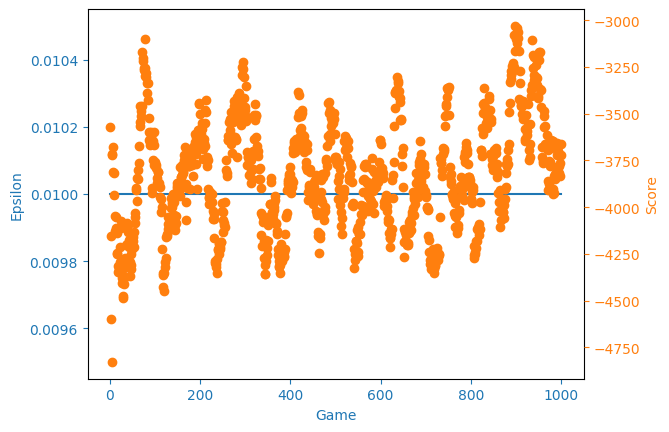

In [74]:
agent = train_model('humvee_17.h5', 'humvee_16.h5')
agent.save_model()

More!!! (0.0005 lr)

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -1810.00 avarage_score -1810.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  1 score -5120.00 avarage_score -3465.00 epsilon 0.01
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score 60.00 avarage_score -2290.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  3 score -4960.00 avarage_score -2957.50 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  4 score -4380.00 avarage_score -3242.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  5 score -4270.00 avarage_score -3413.33 epsilon 0.01
Humvee died
episode:  6 score -4220.00 avarage_score -3528.57 epsilon 0.01
Humvee died
Humvee died
episode:  7 score -4340.00 avarage_score -3630.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -5160.00 avarage_score -3800.00

KeyboardInterrupt: 

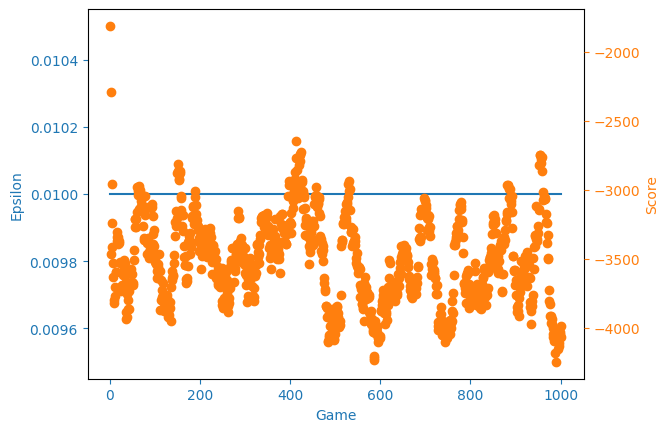

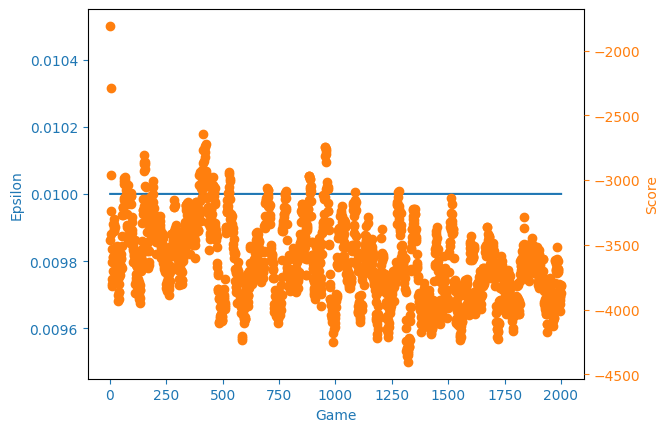

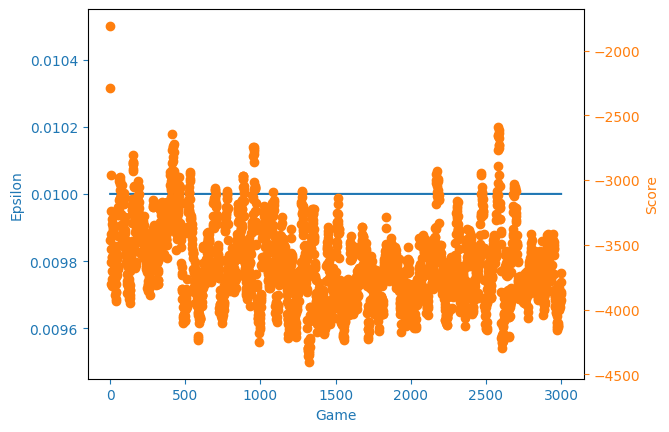

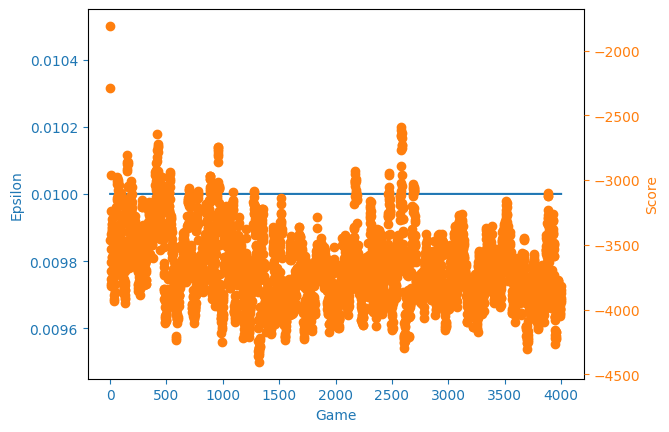

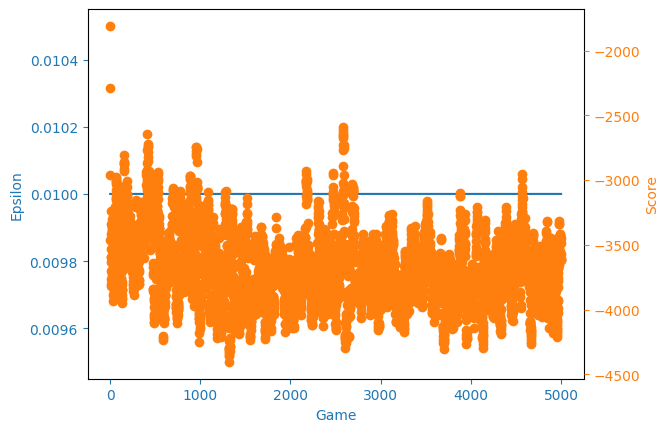

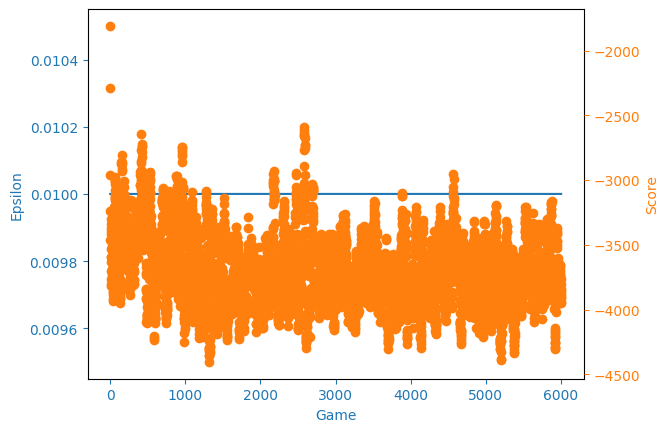

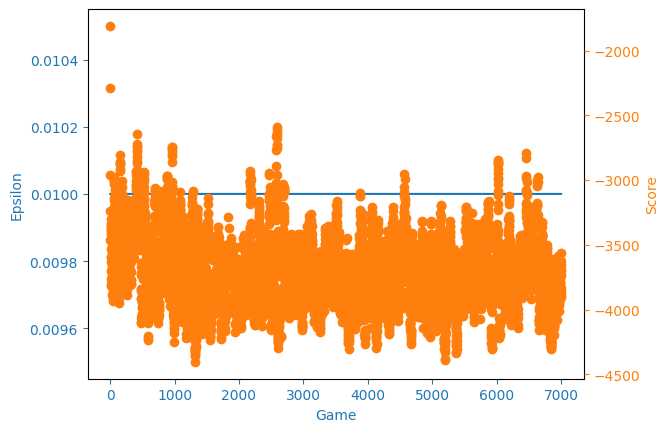

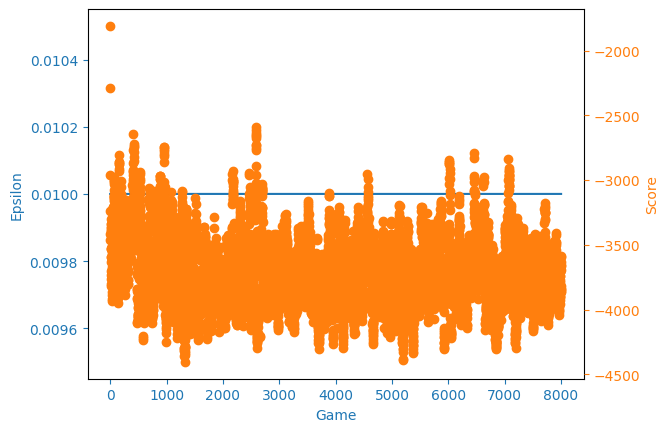

: 

In [91]:
agent = train_model('humvee_18.h5', 'humvee_17.h5')
agent.save_model()

Not much improvement. Let's add a punishment for being in the corner!


Humvee died
Humvee died
episode:  0 score -3770.00 avarage_score -3770.00 epsilon 0.01
Humvee died
episode:  1 score -2820.00 avarage_score -3295.00 epsilon 0.01
Humvee died
episode:  2 score -3160.00 avarage_score -3250.00 epsilon 0.01
Humvee died
episode:  3 score -2860.00 avarage_score -3152.50 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  4 score -4820.00 avarage_score -3486.00 epsilon 0.01
Humvee died
Humvee died
episode:  5 score -4040.00 avarage_score -3578.33 epsilon 0.01
Humvee died
episode:  6 score -2220.00 avarage_score -3384.29 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  7 score -2810.00 avarage_score -3312.50 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -4720.00 avarage_score -3468.89 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  9 score -3940.00 avarage_score -3516.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  10 score -44

TypeError: HumveeAgent.save_model() missing 1 required positional argument: 'append'

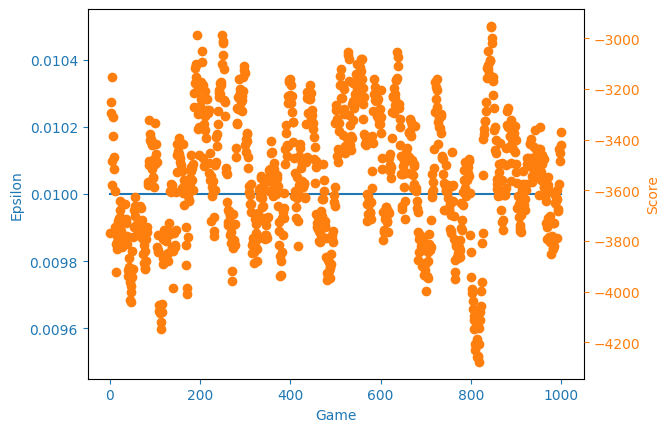

In [12]:
agent = train_model('humvee_19.h5', 'humvee_18.h5_checkpoint_8.0.h5')
agent.save_model()

Doesn't seem like it can learn anymore. Let's train a new, slightly bigger 300x300x300 network!

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  0 score -4890.00 avarage_score -4890.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  1 score -4700.00 avarage_score -4795.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  2 score -4660.00 avarage_score -4750.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  3 score -5260.00 avarage_score -4877.50 epsilon 0.01
Humvee died
episode:  4 score -3540.00 avarage_score -4610.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  5 score -5740.00 avarage_score -4798.33 epsilon 0.01
Humvee died
Humvee died
episode:  6 score -4580.00 avarage_score -4767.14 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  7 score -5170.00 avarage_score -4817.50 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -4990.00 a

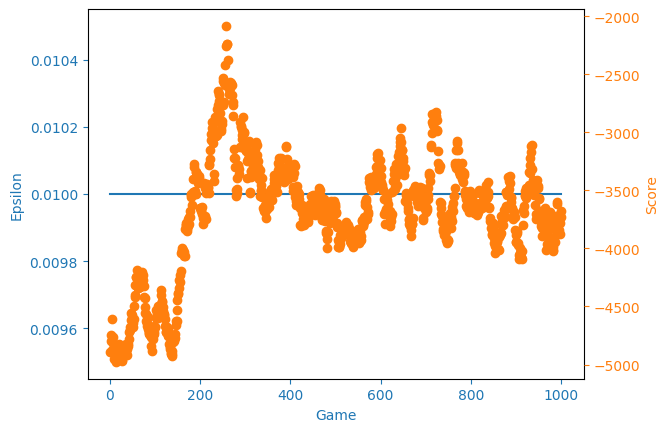

In [15]:
agent = train_model('humvee_large_1.h5')
agent.save_model()

Let's add the humvee's angle to the state and see if it does better


Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  0 score -4490.00 avarage_score -4490.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  1 score -4750.00 avarage_score -4620.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  2 score -5400.00 avarage_score -4880.00 epsilon 0.01
Humvee died
episode:  3 score -4000.00 avarage_score -4660.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  4 score -5540.00 avarage_score -4836.00 epsilon 0.01
Humvee died
Humvee died
episode:  5 score -4120.00 avarage_score -4716.67 epsilon 0.01
Humvee died
episode:  6 score -4120.00 avarage_score -4631.43 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  7 score -5050.00 avarage_score -4683.75 epsilon 0.01
Humvee died
Humvee died
episode:  8 score -4880.00 avarage_score -4705.56 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  9 score -5210.00 avarage_score -4756.00

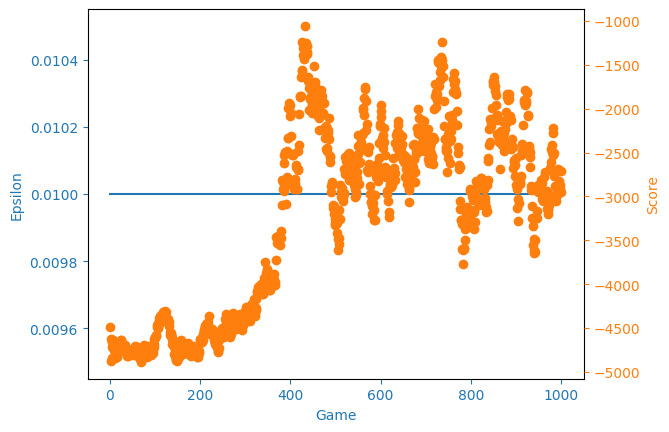

In [21]:
agent = train_model('humvee_large_2.h5')
agent.save_model()

Training over 500 iters never paid off before, so let's limit it to 500.
Next we increase the quad attack range, and increase the negative reward for getting shot.

Humvee died
Humvee died
Humvee died
episode:  0 score -4650.00 avarage_score -4650.00 epsilon 0.01
Humvee died
episode:  1 score -3910.00 avarage_score -4280.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  2 score -4740.00 avarage_score -4433.33 epsilon 0.01
Humvee died
Humvee died
episode:  3 score -3730.00 avarage_score -4257.50 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  4 score -4630.00 avarage_score -4332.00 epsilon 0.01
Humvee died
Humvee died
episode:  5 score -4370.00 avarage_score -4338.33 epsilon 0.01
Humvee died
Humvee died
episode:  6 score -3770.00 avarage_score -4257.14 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  7 score -4680.00 avarage_score -4310.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -3650.00 avarage_score -4236.67 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  9 score -4970.0

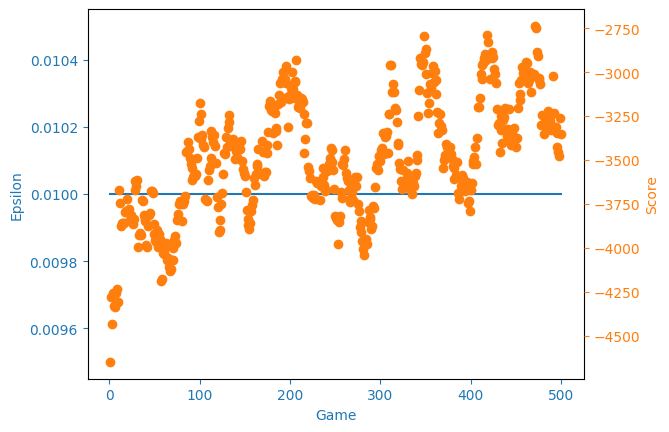

In [31]:
agent = train_model('humvee_large_3', 'humvee_large_2.h5')
agent.save_model()

I messed up the corner punishment, lets do that again

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Humvee died
Humvee died
Humvee died
Humvee died
episode:  0 score -17820.00 avarage_score -17820.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  1 score -8690.00 avarage_score -13255.00 epsilon 0.01
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -12690.00 avarage_score -13066.67 epsilon 0.01
Quads died! :)
episode:  3 score -11380.00 avarage_score -12645.00 epsilon 0.01
Quads died! :)
Quads died! :)
episode:  4 score -7680.00 avarage_score -11652.00 epsilon 0.01
Humvee died
episode:  5 score -14440.00 avarage_score -12116.67 epsilon 0.01
Quads died! :)
episode:  6 score -6950.00 avarage_score -11378.57 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  7 score -13800.00 avarage_score -11681.25 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -6530.00 avarage_score -11108.89 epsilon 0.01
Humvee died
episode:  9 score -7400.00 avara

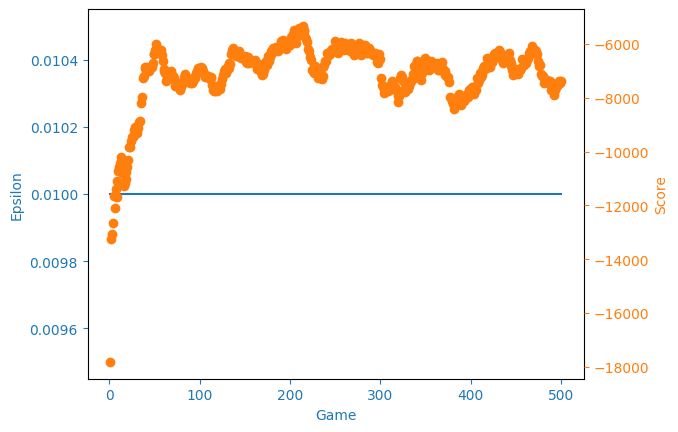

In [35]:
agent = train_model('humvee_large_4', 'humvee_large_3.h5')
agent.save_model()

This new approach seems to be working. More inputs, and harder difficulties. I don't want to hack the game, or use machine learning to get the angle of the humvee, so I will introduce the new inputs:
-4 ints, representing which input was last
-4 floats, representing the distance from the edges of the screen
-2 float representing the closest enemy quad's relative position to us

Humvee died
Humvee died
episode:  0 score -4540.00 avarage_score -4540.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  1 score -5510.00 avarage_score -5025.00 epsilon 0.01
Humvee died
Humvee died
episode:  2 score -6510.00 avarage_score -5520.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  3 score -9300.00 avarage_score -6465.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  4 score -7960.00 avarage_score -6764.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  5 score -8730.00 avarage_score -7091.67 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  6 score -9000.00 avarage_score -7364.29 epsilon 0.01
Humvee died
Humvee died
episode:  7 score -7360.00 avarage_score -7363.75 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -9950.00 avarage_score -7651.11 epsilon 0.01
Humvee died
H

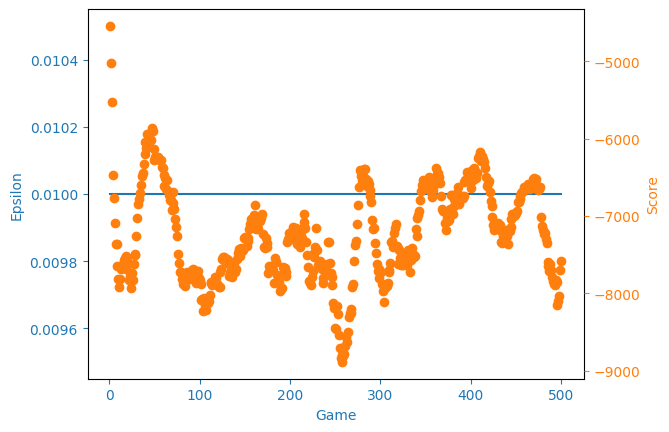

In [54]:
agent = train_model('humvee_large_5')
agent.save_model()

Despite looking like it's not improving, it did improve. Let's rechrease the quad count and lower the vee damage back.

Humvee died
episode:  0 score -7120.00 avarage_score -7120.00 epsilon 0.01
Humvee died
Humvee died
episode:  1 score -7020.00 avarage_score -7070.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  2 score -5940.00 avarage_score -6693.33 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  3 score -7640.00 avarage_score -6930.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  4 score -5490.00 avarage_score -6642.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  5 score -6110.00 avarage_score -6553.33 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  6 score -7770.00 avarage_score -6727.14 epsilon 0.01
Humvee died
Humvee died
episode:  7 score -7630.00 avarage_score -6840.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -7410.00 avarage_score -6903.33 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  9 score -7630.0

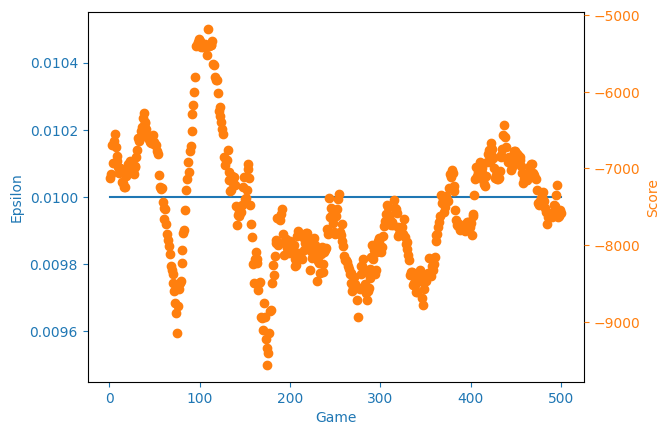

In [60]:
agent = train_model('humvee_large_6')
agent.save_model()

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Humvee died
episode:  0 score -7580.00 avarage_score -7580.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  1 score -6750.00 avarage_score -7165.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  2 score -5220.00 avarage_score -6516.67 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  3 score -5270.00 avarage_score -6205.00 epsilon 0.01
Quads died! :)
episode:  4 score -12820.00 avarage_score -7528.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  5 score -9610.00 avarage_score -7875.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  6 score -8110.00 avarage_score -7908.57 epsilon 0.01
Humvee died
episode:  7 score -4780.00 avarage_score -7517.50 epsilon 0.01
Humvee died
Humvee died
Humvee died
episode:  8 score -7590.00 avarage_score -7525.56 epsilon 0.01
Humvee died
Humvee died
episode:  9 score -6790.00 avarage_score -7452.00 epsilon 0.01
Humvee

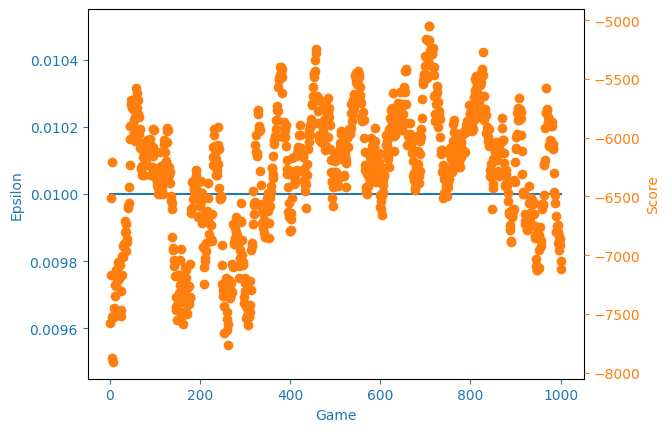

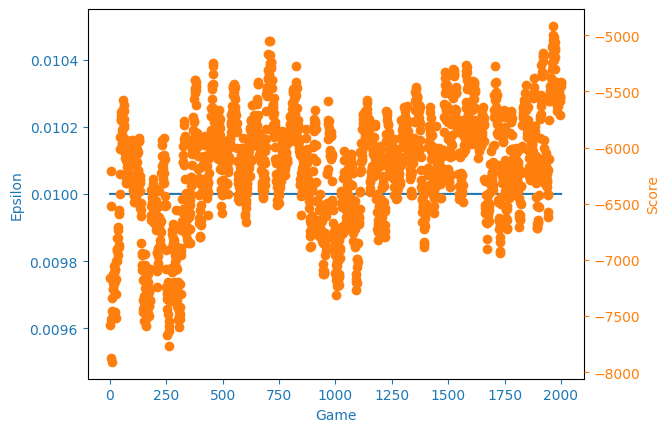

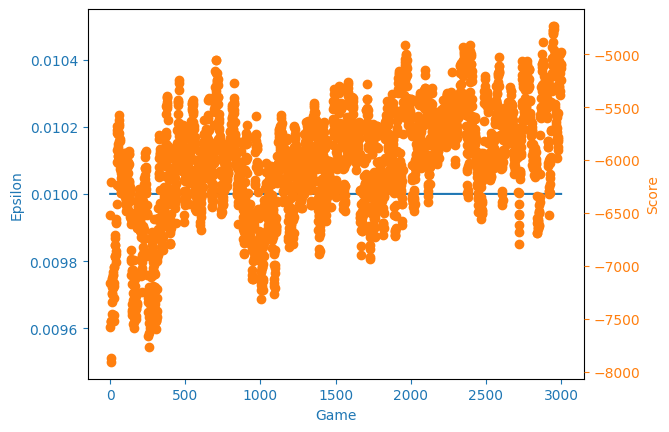

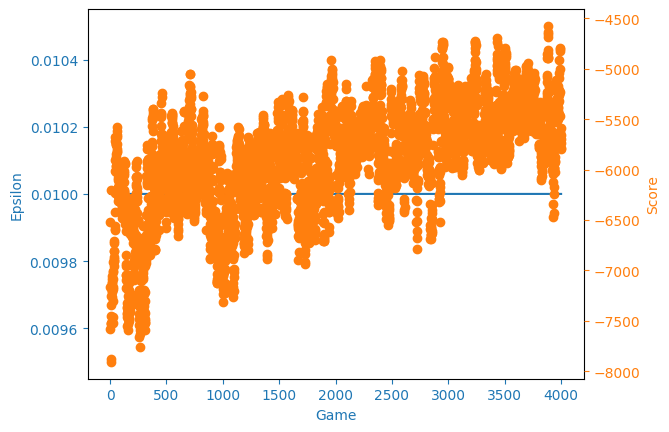

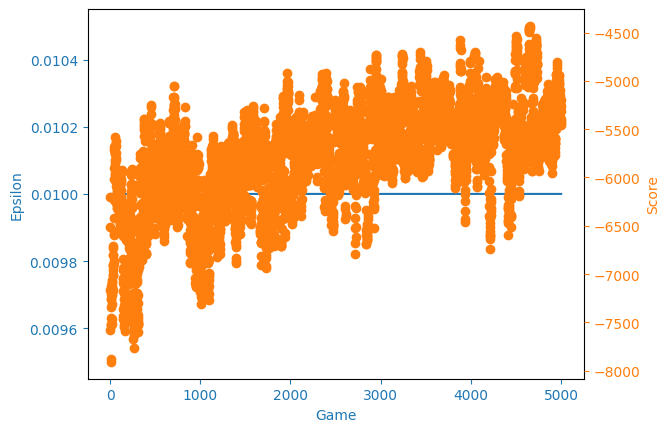

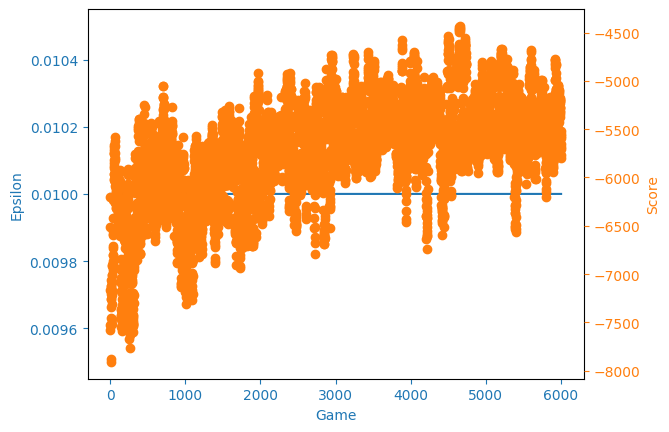

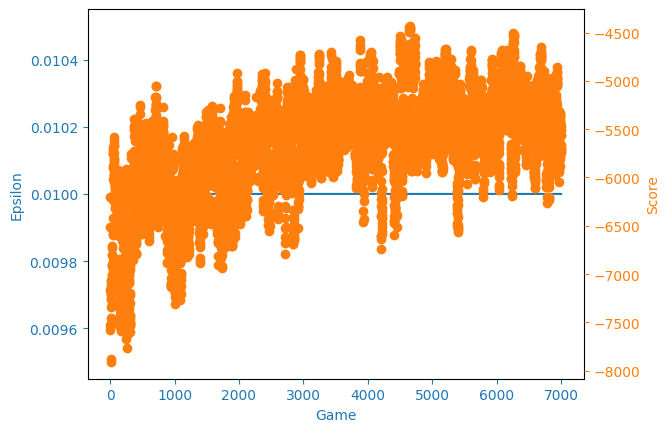

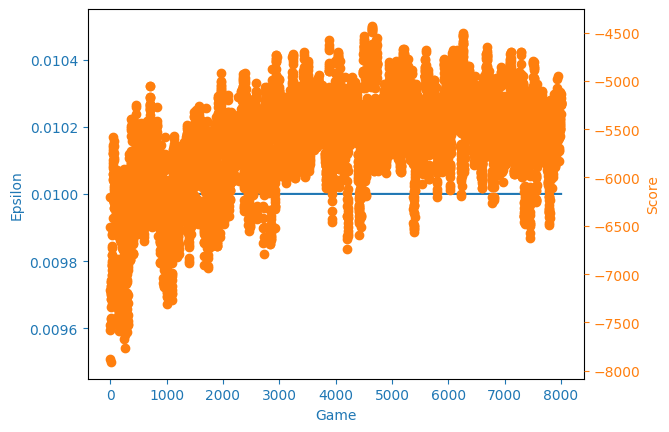

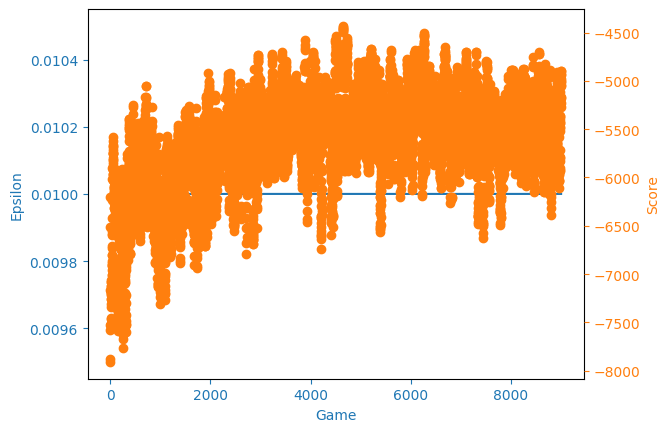

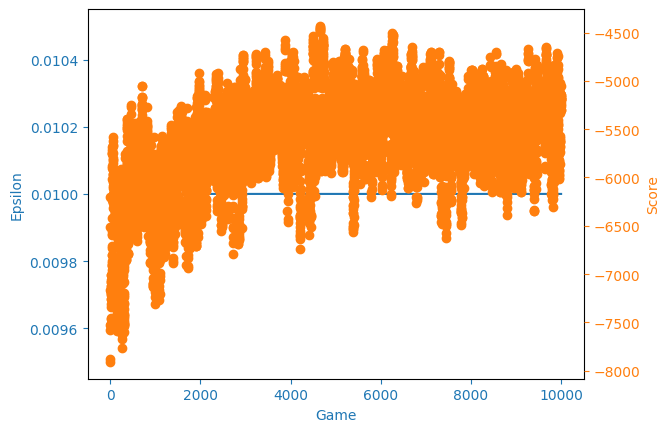

In [8]:
agent = train_model('humvee_large_7', 'humvee_large_6.h5')
agent.save_model()

Great! Now let's slow down the humvee to be more realistic

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Humvee died
Humvee died
Humvee died
Humvee died
episode:  0 score -4890.00 avarage_score -4890.00 epsilon 0.01
Humvee died
Humvee died
episode:  1 score -10080.00 avarage_score -7485.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  2 score -6310.00 avarage_score -7093.33 epsilon 0.01
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -5090.00 avarage_score -6592.50 epsilon 0.01
Humvee died
episode:  4 score -7520.00 avarage_score -6778.00 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
Humvee died
episode:  5 score -7510.00 avarage_score -6900.00 epsilon 0.01
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -3700.00 avarage_score -6442.86 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  7 score -4400.00 avarage_score -6187.50 epsilon 0.01
Humvee died
Humvee died
Humvee died
Humvee died
episode:  8 score -6480.00 avarage_score -6220.00 epsilon 0.01
Humvee died
Humvee died
Humvee

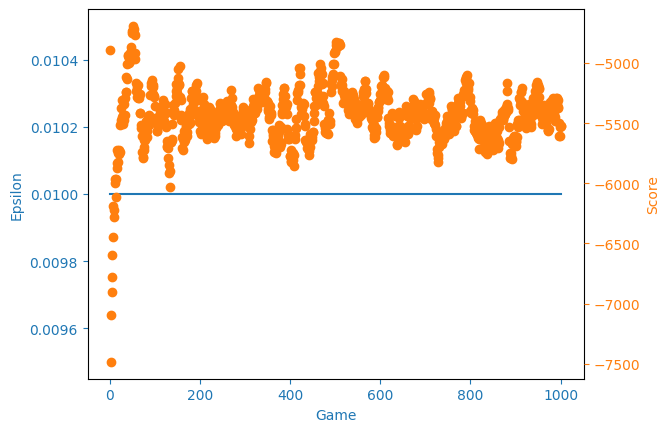

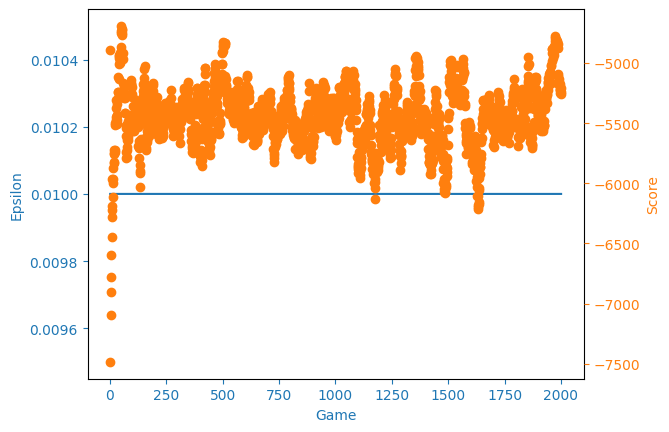

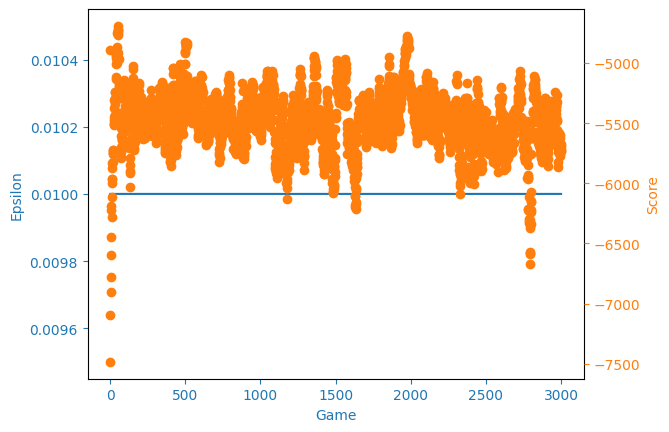

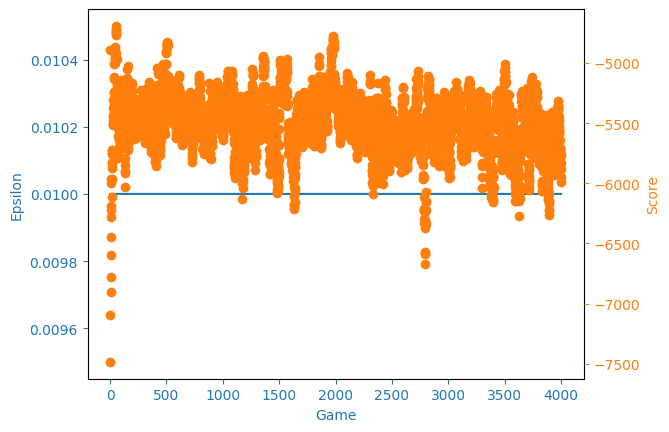

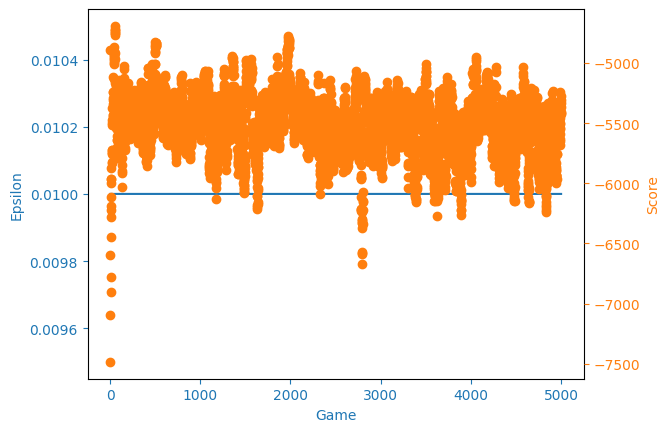

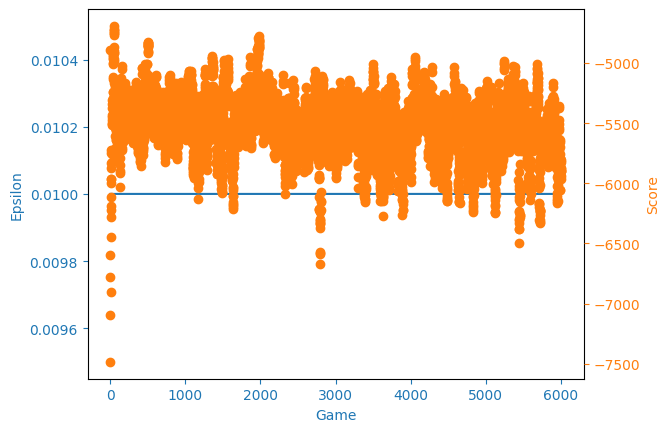

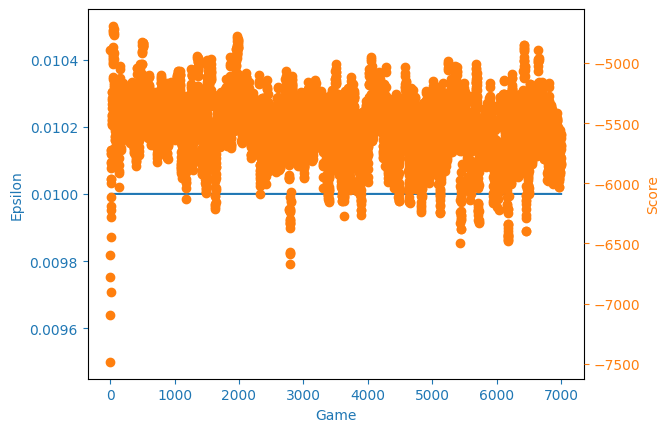

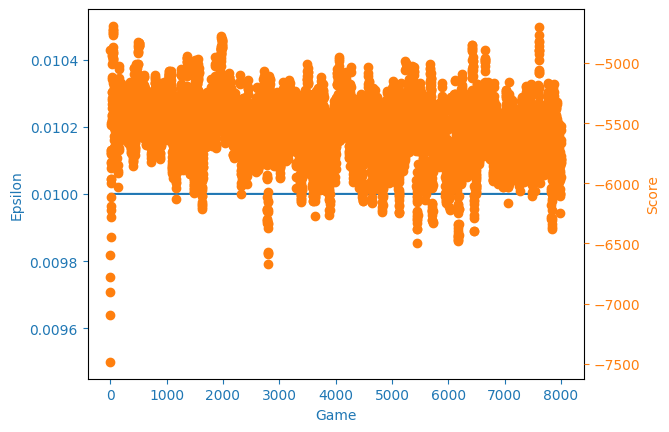

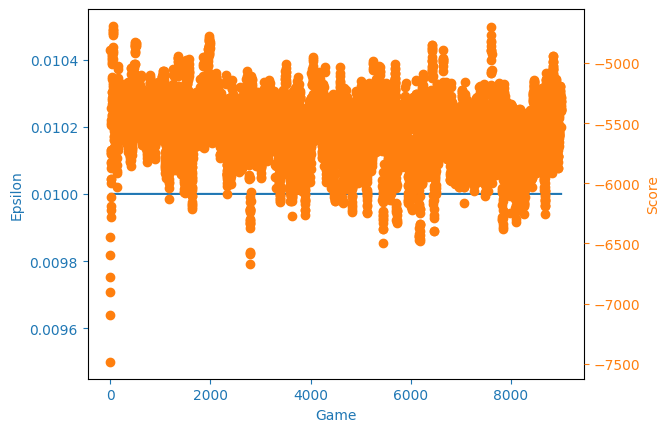

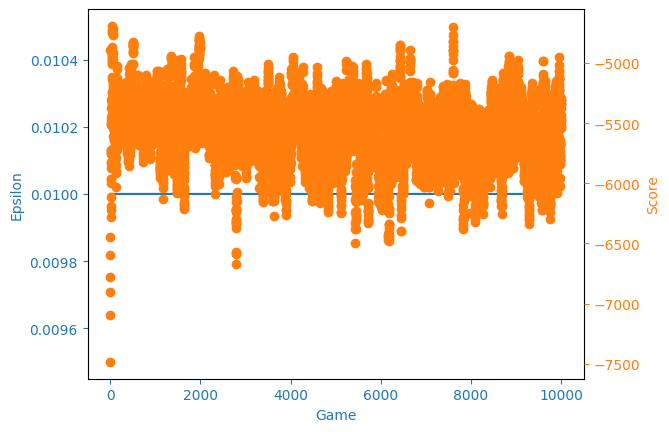

In [10]:
agent = train_model('humvee_large_8', 'humvee_large_7.h5')
agent.save_model()

Not much better. Let's train them on low damage.

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -124.91 avarage_score -124.91 epsilon 0.99
Quads died! :)
episode:  1 score -49.62 avarage_score -87.27 epsilon 0.98
Quads died! :)
episode:  2 score -209.47 avarage_score -128.00 epsilon 0.98
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -59.23 avarage_score -110.81 epsilon 0.97
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -14.63 avarage_score -91.57 epsilon 0.95
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score 1.49 avarage_score -76.06 epsilon 0.94
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score 14.73 avarage_score -63.09 epsilon 0.94
Quads died! :)
Quads died! :)
episode:  7 score -76.13 avarage_score -64.72 epsilon 0.92
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  8 score -43.56 avarage_score -62.37 epsilon 0.91
Quads died! :)
Quads died! :)
Quads died! :)
Qu

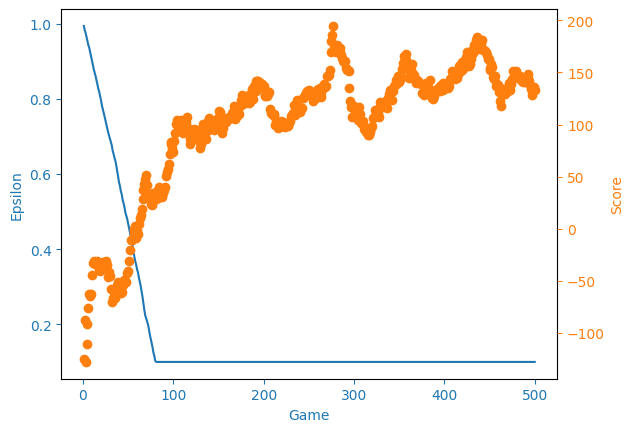

In [74]:
agent = train_model('humvee_large_9', 'humvee_large_8.h5')
agent.save_model()

Great but I inverted the quad attack punishement, oops. let's fix that


c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
episode:  0 score -18279.37 avarage_score -18279.37 epsilon 1.00
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -15080.14 avarage_score -16679.75 epsilon 0.98
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -19937.83 avarage_score -17765.78 epsilon 0.97
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -20368.77 avarage_score -18416.53 epsilon 0.96
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -16796.81 avarage_score -18092.58 epsilon 0.95
Quads died! :)
Quads died! :)
episode:  5 score -18925.50 avarage_score -18231.40 epsilon 0.94
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -17544.41 avarage_score -18133.26 epsilon 0.93
Quads died! :)
Quads died! :)
episode:  7 score -18590.63 avarage_score -18190.43 epsilon 0.91
Quads died! :)
Quads died! :)


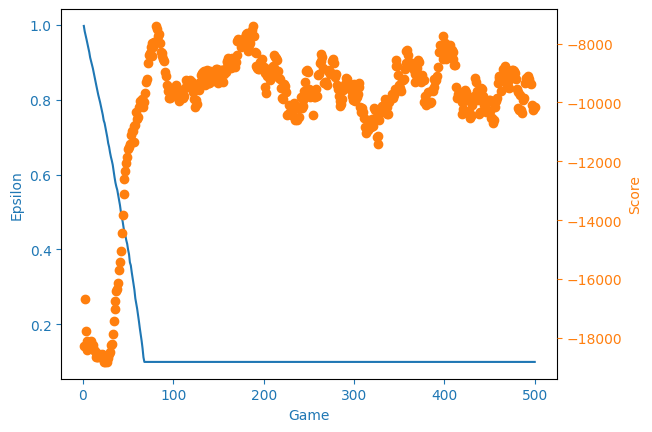

In [77]:
agent = train_model('humvee_large_10', 'humvee_large_9.h5')
agent.save_model()

Let's do the same but with a bigger learning rate!

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -16661.81 avarage_score -16661.81 epsilon 1.00
Quads died! :)
Quads died! :)
episode:  1 score -19930.92 avarage_score -18296.36 epsilon 0.98
Quads died! :)
episode:  2 score -20225.62 avarage_score -18939.45 epsilon 0.98
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -20291.45 avarage_score -19277.45 epsilon 0.97
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -18454.92 avarage_score -19112.94 epsilon 0.96
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -19259.32 avarage_score -19137.34 epsilon 0.95
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -20203.96 avarage_score -19289.71 epsilon 0.93
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -18935.23 avarage_score -19245.40 epsilon 0.92
Quads died! :)
episode:  8 score -19754.88 avarage_score -19302.01 epsilon 0.91
Quads died

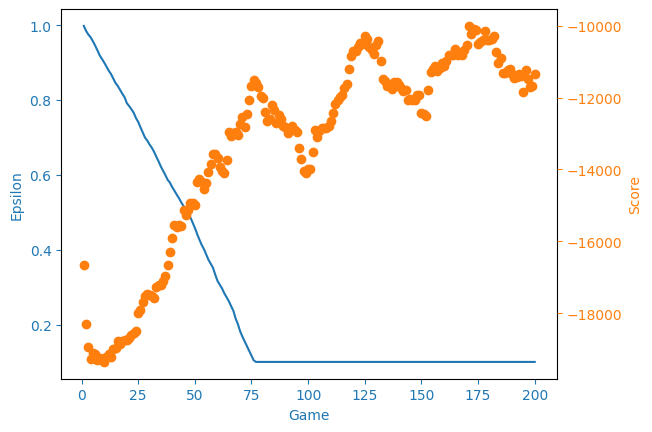

In [81]:
agent = train_model('humvee_large_11', 'humvee_large_9.h5')
agent.save_model()

Worse. Let's try MSE instead

Quads died! :)
episode:  0 score -20464.20 avarage_score -20464.20 epsilon 1.00
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -20368.24 avarage_score -20416.22 epsilon 0.99
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -19741.96 avarage_score -20191.47 epsilon 0.98
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -19546.29 avarage_score -20030.17 epsilon 0.97
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -19274.26 avarage_score -19878.99 epsilon 0.96
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -16371.54 avarage_score -19294.41 epsilon 0.95
Quads died! :)
episode:  6 score -20671.46 avarage_score -19491.14 epsilon 0.94
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -18104.80 avarage_score -19317.84 epsilon 0.92
Quads died! :)
Quads died! :)


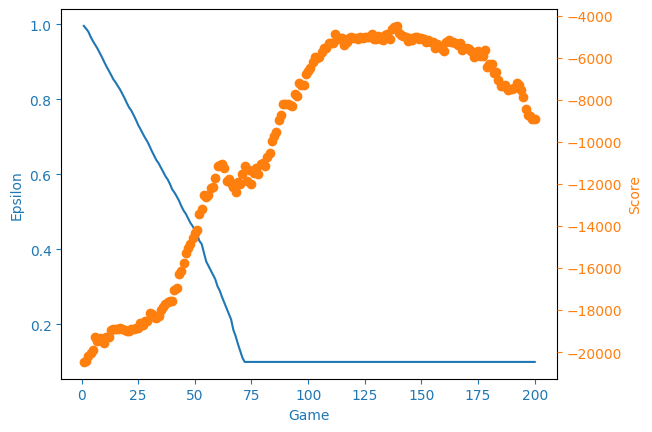

In [84]:
agent = train_model('humvee_large_12', 'humvee_large_9.h5')
agent.save_model()

Way better! Let's add a larger punishment for going in the corners

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -21613.51 avarage_score -21613.51 epsilon 0.99
Quads died! :)
Quads died! :)
episode:  1 score -21320.32 avarage_score -21466.92 epsilon 0.98
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -20862.56 avarage_score -21265.46 epsilon 0.97
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -21277.43 avarage_score -21268.45 epsilon 0.96
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -21085.75 avarage_score -21231.91 epsilon 0.95
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -19065.70 avarage_score -20870.88 epsilon 0.94
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -20147.08 avarage_score -20767.48 epsilon 0.92
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -21113.80 avarage_score -20810.77 epsilon 0.91


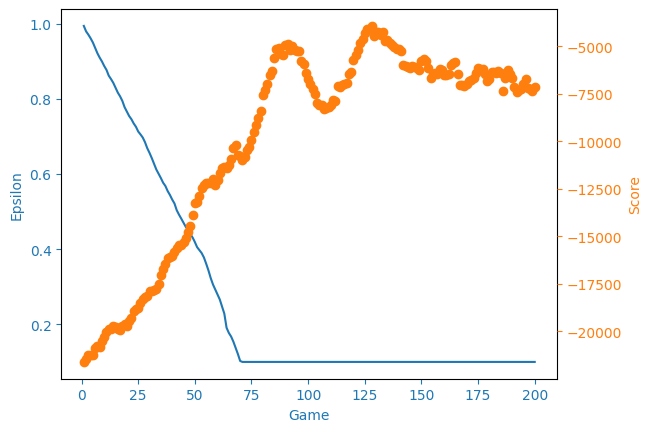

In [88]:
agent = train_model('humvee_large_13', 'humvee_large_12.h5')
agent.save_model()

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -28742.32 avarage_score -28742.32 epsilon 1.00
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -29066.94 avarage_score -28904.63 epsilon 1.00
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -25672.91 avarage_score -27827.39 epsilon 1.00
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died

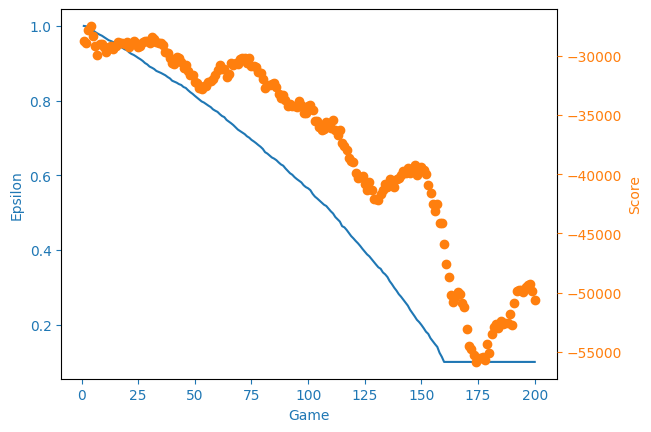

In [92]:
agent = train_model('humvee_large_14', 'humvee_large_13.h5')
agent.save_model()

Let's add larger time steps so the ai starts thinking long-term

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -34756.60 avarage_score -34756.60 epsilon 1.00
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -32243.03 avarage_score -33499.81 epsilon 1.00
Quads died! :)
Quads died! :)
episode:  2 score -32167.38 avarage_score -33055.67 epsilon 0.99
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died

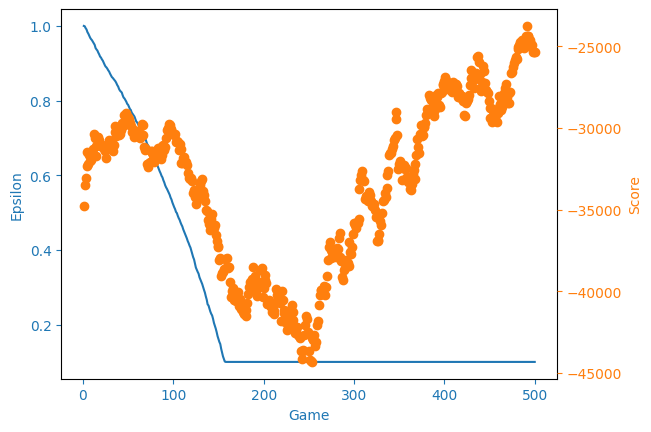

In [95]:
agent = train_model('humvee_large_15', 'humvee_large_14.h5')
agent.save_model()

Now let's slow it back down!

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
episode:  0 score -17551.89 avarage_score -17551.89 epsilon 0.49
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -21347.44 avarage_score -19449.67 epsilon 0.48
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -19737.53 avarage_score -19545.62 epsilon 0.47
Quads died! :)
Quads died! :)
episode:  3 score -16711.62 avarage_score -18837.12 epsilon 0.46
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -20727.87 avarage_score -19215.27 epsilon 0.45
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -21728.35 avarage_score -19634.12 epsilon 0.44
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -22530.33 avarage_score -20047.86 epsilon 0.42
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -22884.35 avarage_score -20402.4

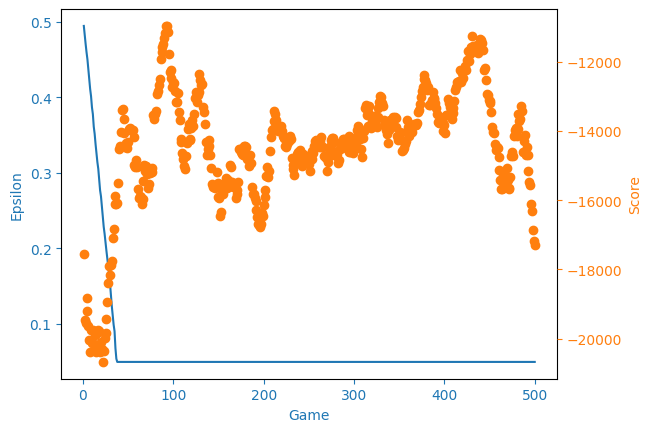

In [101]:
agent = train_model('humvee_large_16', 'humvee_large_15.h5')
agent.save_model()

The model actually beat 5 quads in game! The mission was a success!

Just uh, train it more and make the humvee slower

Quads died! :)
Quads died! :)
episode:  0 score -23496.23 avarage_score -23496.23 epsilon 0.50
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -23377.00 avarage_score -23436.61 epsilon 0.49
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -27241.26 avarage_score -24704.83 epsilon 0.48
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -22212.32 avarage_score -24081.70 epsilon 0.46
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -22674.62 avarage_score -23800.29 epsilon 0.45
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -28312.56 avarage_score -24552.33 epsilon 0.44
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -18128.55 avarage_score -23634.65 epsilon 0.43
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -22923.05 avarage_score -23545.70 epsilon 0.42
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)


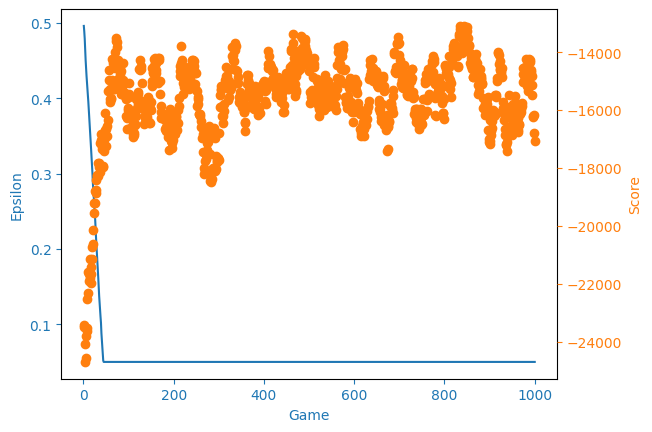

In [111]:
agent = train_model('humvee_large_17', 'humvee_large_16.h5')
agent.save_model()

Great! Now let's train it so it does't get stuck inside of the enemy range

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -27238.27 avarage_score -27238.27 epsilon 0.50
Quads died! :)
episode:  1 score -44096.09 avarage_score -35667.18 epsilon 0.47
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -22327.39 avarage_score -31220.59 epsilon 0.46
Quads died! :)
episode:  3 score -23491.56 avarage_score -29288.33 epsilon 0.45
Quads died! :)
Quads died! :)
episode:  4 score -23633.72 avarage_score -28157.41 epsilon 0.44
Quads died! :)
Quads died! :)
episode:  5 score -28284.71 avarage_score -28178.63 epsilon 0.43
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -27043.63 avarage_score -28016.48 epsilon 0.43
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -25307.35 avarage_score -27677.84 epsilon 0.42
Quads died! :)
Quads died! :)
Quads died! :)
episode:  8 score -30121.78 avarage_score -27949.39 epsilon 

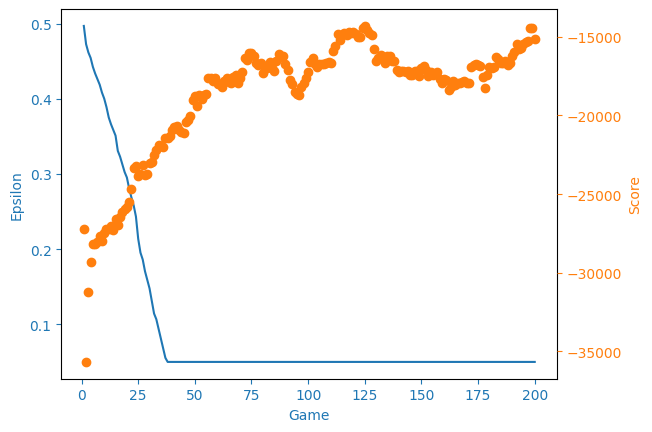

In [114]:
agent = train_model('humvee_large_18', 'humvee_large_17.h5')
agent.save_model()

Let's train another network, that is just simply larger 300x300x300 -> 400x400x400

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -25876.38 avarage_score -25876.38 epsilon 0.49
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -36278.65 avarage_score -31077.52 epsilon 0.48
Quads died! :)
Quads died! :)
episode:  2 score -27329.15 avarage_score -29828.06 epsilon 0.46
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -29400.03 avarage_score -29721.06 epsilon 0.46
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -28612.87 avarage_score -29499.42 epsilon 0.44
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -30209.32 avarage_score -29617.74 epsilon 0.43
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -34285.63 avarage_score -30284.58 epsilon 0.41
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -22007.84 avarage_score -29249.99 epsilon 0.41
Quads died! :)
episode:  8 sco

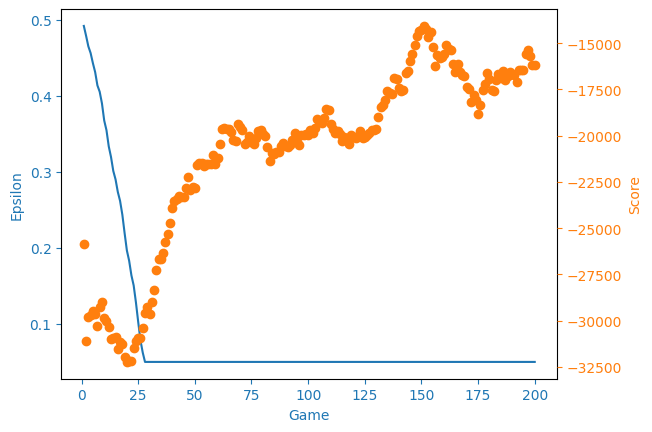

In [124]:
agent = train_model('humvee_largest_19')
agent.save_model()

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -22991.48 avarage_score -22991.48 epsilon 0.50
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -23371.46 avarage_score -23181.47 epsilon 0.49
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -20461.93 avarage_score -22274.96 epsilon 0.48
Quads died! :)
Quads died! :)
episode:  3 score -21857.67 avarage_score -22170.63 epsilon 0.47
Quads died! :)
episode:  4 score -21823.87 avarage_score -22101.28 epsilon 0.46
Quads died! :)
Quads died! :)
episode:  5 score -25983.28 avarage_score -22748.28 epsilon 0.45
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -27108.48 avarage_score -23371.17 epsilon 0.44
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -21112.47 avarage_score -23088.83 epsilon 0.43
Quads died! :)
Quads died! :)
Quads died! :)


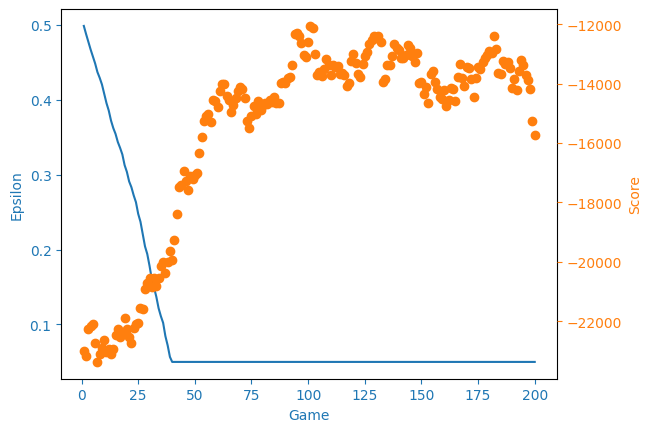

In [126]:
agent = train_model('humvee_largest_20', 'humvee_largest_19.h5')
agent.save_model()

Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -24138.11 avarage_score -24138.11 epsilon 0.49
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -23561.04 avarage_score -23849.57 epsilon 0.48
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -21575.47 avarage_score -23091.54 epsilon 0.47
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -35018.85 avarage_score -26073.37 epsilon 0.46
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -18346.66 avarage_score -24528.03 epsilon 0.45
Quads died! :)
episode:  5 score -17235.23 avarage_score -23312.56 epsilon 0.44
Quads died! :)
Quads died! :)
episode:  6 score -20250.04 avarage_score -22875.06 epsilon 0.43
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -21478.30 avarage_score -22700.46 epsilon 0.42
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)


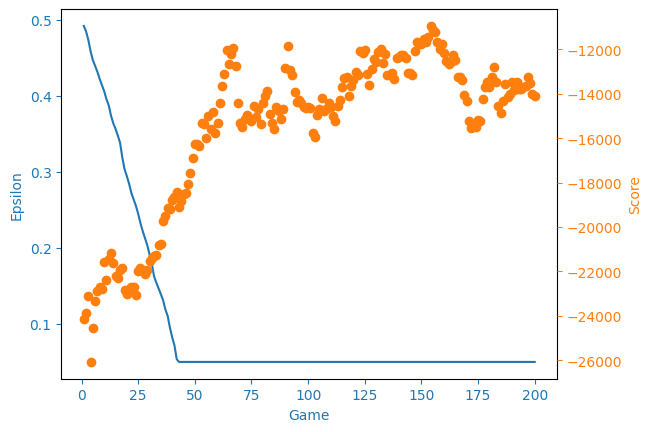

In [130]:
agent = train_model('humvee_largest_21', 'humvee_largest_20.h5')
agent.save_model()

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -22655.96 avarage_score -22655.96 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -28948.72 avarage_score -25802.34 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -21900.55 avarage_score -24501.74 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -21793.29 avarage_score -23824.63 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -8254.77 avarage_score -20710.66 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -6447.92 avarage_score -18333.53 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -7216.02 avarage_score -16745.32 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -29927.87 avarage_score -18393.14 epsilon 0.05
Quads died! :)
Qua

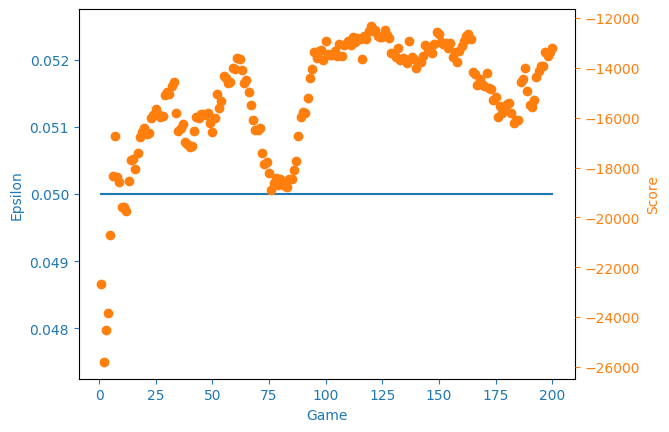

In [135]:
agent = train_model('humvee_largest_22', 'humvee_largest_21.h5')
agent.save_model()

Let's add another layer, 400x400x400 -> 400x400x400x400

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
episode:  0 score -35398.04 avarage_score -35398.04 epsilon 0.49
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -23299.40 avarage_score -29348.72 epsilon 0.49
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -24541.67 avarage_score -27746.37 epsilon 0.48
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -22240.64 avarage_score -26369.94 epsilon 0.47
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -21013.41 avarage_score -25298.63 epsilon 0.46
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -28419.11 avarage_score -25818.71 epsilon 0.45
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -21841.82 avarage_score -25250.58 epsilon 0.44
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -30829.66 avarage_score -25947.9

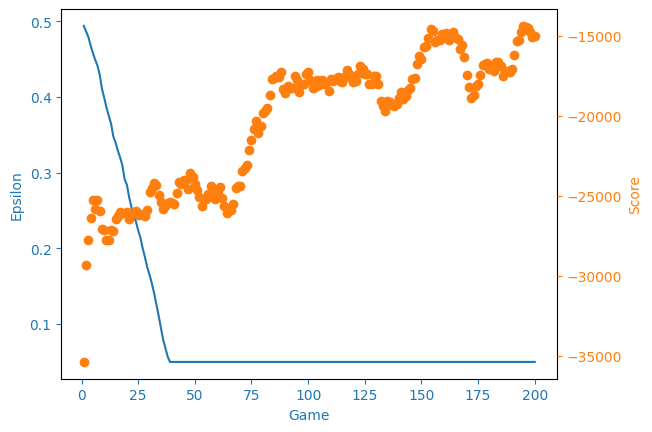

In [139]:
agent = train_model('humvee_largest_23')
agent.save_model()

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
episode:  0 score -9688.23 avarage_score -9688.23 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -11804.59 avarage_score -10746.41 epsilon 0.05
Quads died! :)
episode:  2 score -26353.89 avarage_score -15948.91 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -18882.07 avarage_score -16682.20 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -28922.13 avarage_score -19130.18 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  5 score -20447.07 avarage_score -19349.66 epsilon 0.05
Quads died! :)
episode:  6 score -10305.62 avarage_score -18057.66 epsilon 0.05
Quads died! :)
episode:  7 score -13017.87 avarage_score -17427.68 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  8 score -19499.27 avarage_score -17657.86 epsilon 0.05
Quads died! :)
episode:  9 score -13303.94 avarage_score -17222.47 epsilon 0.05
Quads d

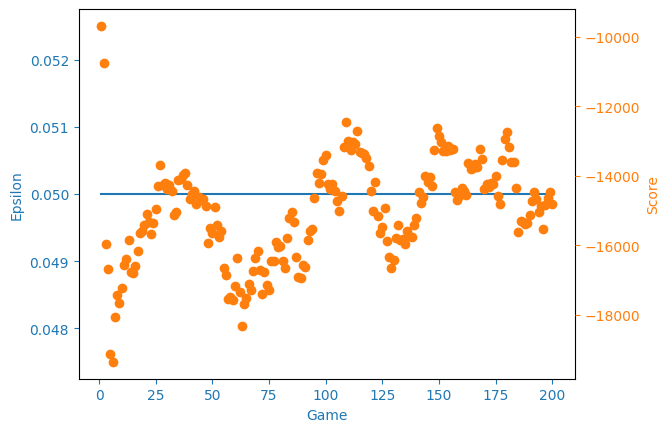

In [142]:
agent = train_model('humvee_largest_24', 'humvee_largest_23.h5')
agent.save_model()

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -24448.94 avarage_score -24448.94 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -12578.82 avarage_score -18513.88 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  2 score -19096.46 avarage_score -18708.07 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -16686.58 avarage_score -18202.70 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -21861.90 avarage_score -18934.54 epsilon 0.05
Quads died! :)
episode:  5 score -27170.83 avarage_score -20307.25 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -14815.33 avarage_score -19522.69 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -14254.63 avarage_score -18864.19 epsilon 0.05


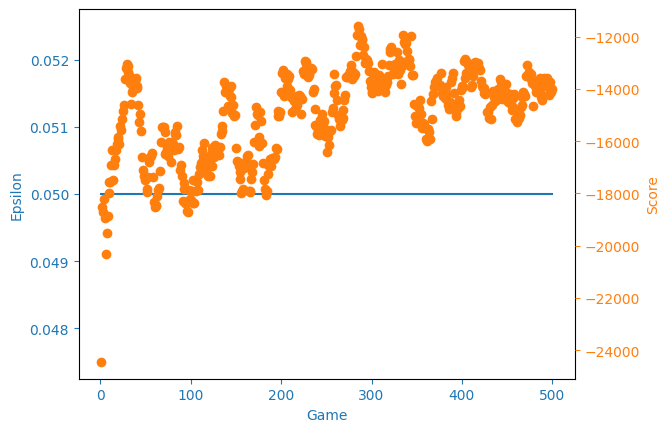

In [144]:
agent = train_model('humvee_largest_25', 'humvee_largest_24.h5')
agent.save_model()

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -15607.63 avarage_score -15607.63 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  1 score -11868.52 avarage_score -13738.08 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  2 score -12052.99 avarage_score -13176.38 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  3 score -17043.76 avarage_score -14143.23 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  4 score -35095.63 avarage_score -18333.71 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  5 score -25479.13 avarage_score -19524.61 epsilon 0.05
Quads died! :)
episode:  6 score -30770.31 avarage_score -21131.14 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -34183.81 avarage_score -22762.72 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  8 score -10476.06 avarage_score -21397.54 epsilon 0.05
Quads died! :)
Quads died

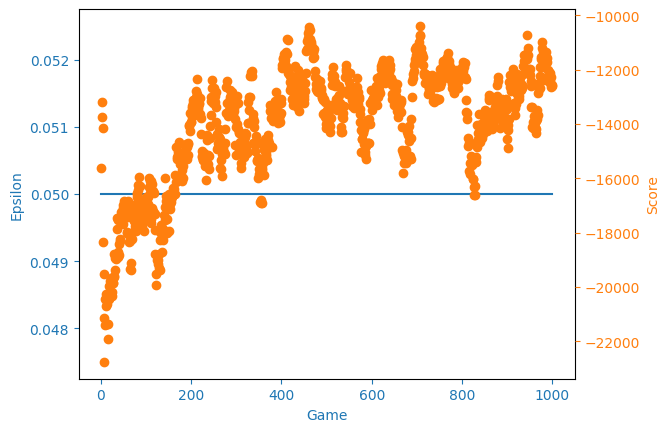

In [146]:
agent = train_model('humvee_largest_26', 'humvee_largest_25.h5')
agent.save_model()

500x500x500x500

Quads died! :)
episode:  0 score -38188.20 avarage_score -38188.20 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -31877.23 avarage_score -35032.72 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -37734.34 avarage_score -35933.26 epsilon 0.05
Quads died! :)
episode:  3 score -23731.67 avarage_score -32882.86 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -24291.33 avarage_score -31164.56 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -38758.62 avarage_score -32430.23 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -25121.66 avarage_score -31386.15 epsilon 0.05
Quads died! :)
episode:  7 score -22007.38 avarage_score -30213.81 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  8 score -23121.15 avarage_score -29425.73 epsilon 0.05
Quads died! :)
Quads died

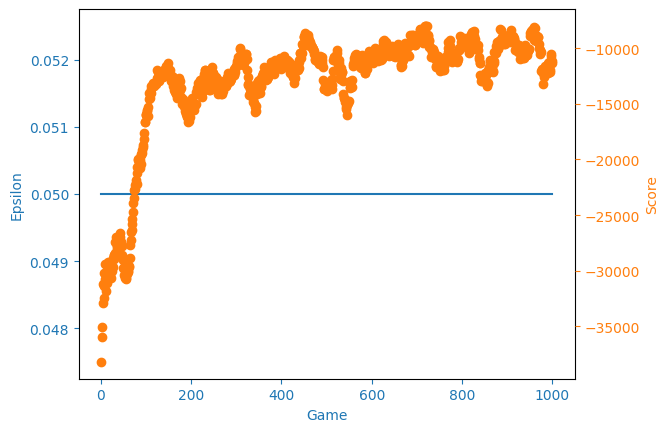

: 

In [149]:
agent = train_model('humvee_largestt_1')
agent.save_model()

Good stuff! Now I just gotta fix it being stuck in the enemy...

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -22552.36 avarage_score -22552.36 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -11008.91 avarage_score -16780.63 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -10007.43 avarage_score -14522.90 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -14320.17 avarage_score -14472.22 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -26126.87 avarage_score -16803.15 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -27107.31 avarage_score -18520.51 epsilon 0.05
Quads died! :)
episode:  6 score -15952.00 avarage_score -18153.58 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -13324.31 avarage_score -17549.9

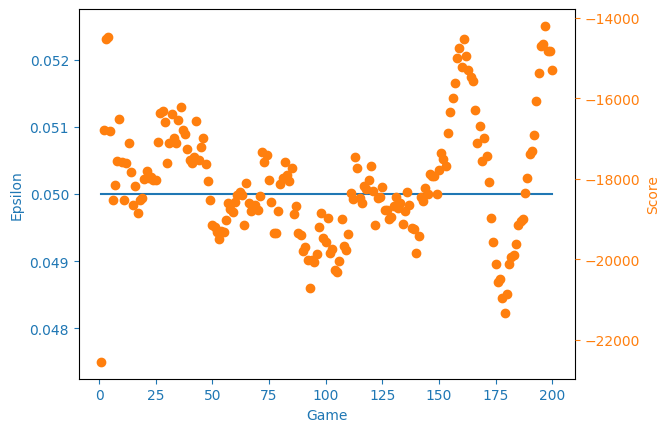

In [12]:
agent = train_model('humvee_largestt_2', 'humvee_largestt_1.h5')
agent.save_model()

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -28683.95 avarage_score -28683.95 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -9391.66 avarage_score -19037.80 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  2 score -16734.65 avarage_score -18270.08 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -13560.16 avarage_score -17092.60 epsilon 0.05
Quads died! :)
episode:  4 score -27058.99 avarage_score -19085.88 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -17990.23 avarage_score -18903.27 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -8817.99 avarage_score -17462.52 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -12790.47 avarage_score -16878.51 epsilon 0.05
Quads died! :)
episode:  8 score -10540.56 avar

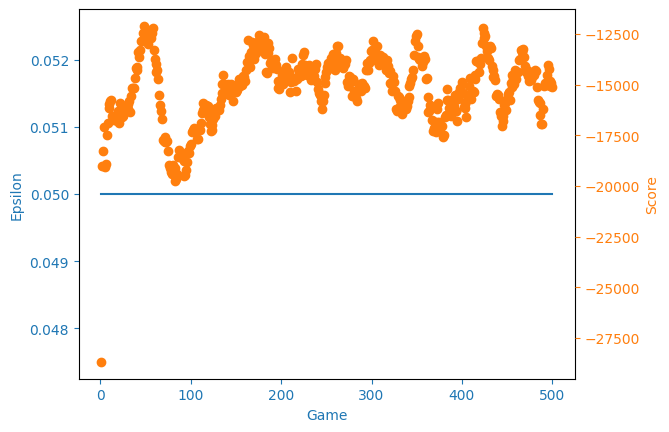

In [16]:
agent = train_model('humvee_largestt_3', 'humvee_largestt_2.h5')
agent.save_model()

Okay, lets slow the humvee turning speed again...

Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  0 score -9896.16 avarage_score -9896.16 epsilon 0.05
Quads died! :)
episode:  1 score -9008.56 avarage_score -9452.36 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -16662.01 avarage_score -11855.58 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -26352.74 avarage_score -15479.87 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  4 score -12339.58 avarage_score -14851.81 epsilon 0.05
Quads died! :)
episode:  5 score -7362.88 avarage_score -13603.66 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  6 score -14255.04 avarage_score -13696.71 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  7 score -7603.47 avarage_score -12935.06 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  8 score -24904.20 avarage_score -14264.96 epsilon 0.05
Q

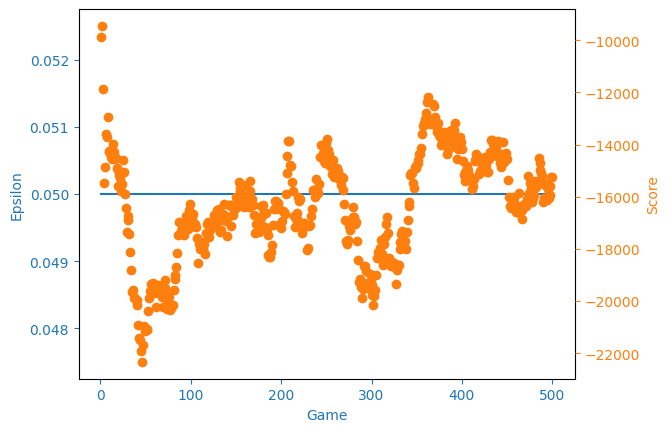

In [18]:
agent = train_model('humvee_largestt_4', 'humvee_largestt_3.h5')
agent.save_model()

Let's increase the penalty for being too far outside the map!

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
episode:  0 score -55994.35 avarage_score -55994.35 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -39777.27 avarage_score -47885.81 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  2 score 2162.20 avarage_score -31203.14 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -48778.26 avarage_score -35596.92 epsilon 0.05
Quads died! :)
episode:  4 score -17943.53 avarage_score -32066.24 epsilon 0.05
Quads died! :)
episode:  5 score -65300.07 avarage_score -37605.21 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score 217.78 avarage_score -32201.93 epsilon 0.05
Quads died! :)
episode:  7 score -41136.17 avarage_score -33318.71 epsilon 0.05
Quads died! :)
episode:  8 score -6242.10 avarage_score -30310.20 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  9 score -31546.43 ava

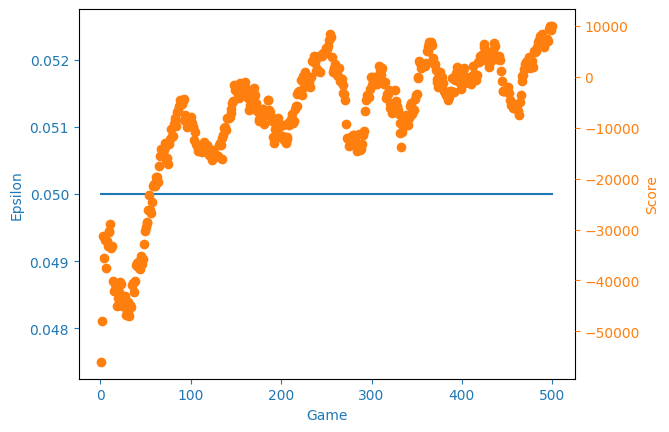

In [21]:
agent = train_model('humvee_largestt_5', 'humvee_largestt_4.h5')
agent.save_model()

Let's uh, keep training, and remove the penality for being far from the center

Quads died! :)
episode:  0 score -8332.10 avarage_score -8332.10 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -15660.13 avarage_score -11996.11 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  2 score -9150.13 avarage_score -11047.45 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  3 score -8245.69 avarage_score -10347.01 epsilon 0.05
Quads died! :)
episode:  4 score -7996.60 avarage_score -9876.93 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -12067.55 avarage_score -10242.03 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -12287.64 avarage_score -10534.26 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -10047.84 avarage_score -10473.46 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episod

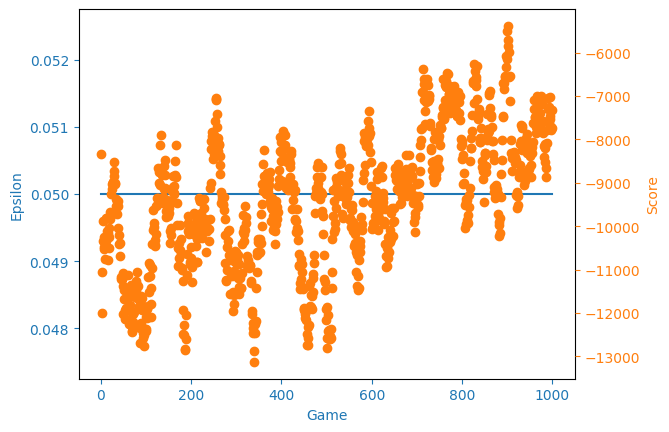

In [25]:
agent = train_model('humvee_largestt_6', 'humvee_largestt_5.h5')
agent.save_model()

c:\Users\patri\Desktop\projects\reinforcement-1\.venv\lib\site-packages\keras\engine\training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Quads died! :)
episode:  0 score -15713.23 avarage_score -15713.23 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  1 score -11127.83 avarage_score -13420.53 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  2 score -9977.07 avarage_score -12272.71 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
episode:  3 score -10392.95 avarage_score -11802.77 epsilon 0.05
Quads died! :)
Quads died! :)
episode:  4 score -13133.40 avarage_score -12068.89 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  5 score -7250.32 avarage_score -11265.80 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  6 score -7928.29 avarage_score -10789.01 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
Quads died! :)
episode:  7 score -9155.15 avarage_score -10584.78 epsilon 0.05
Quads died! :)
Quads died! :)
Quads died! :)
Quad

KeyboardInterrupt: 

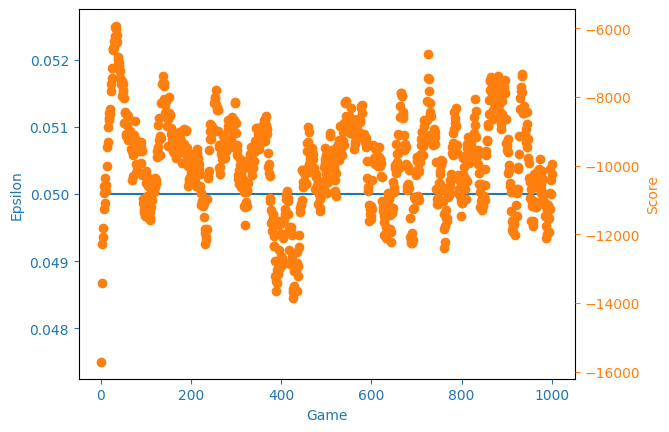

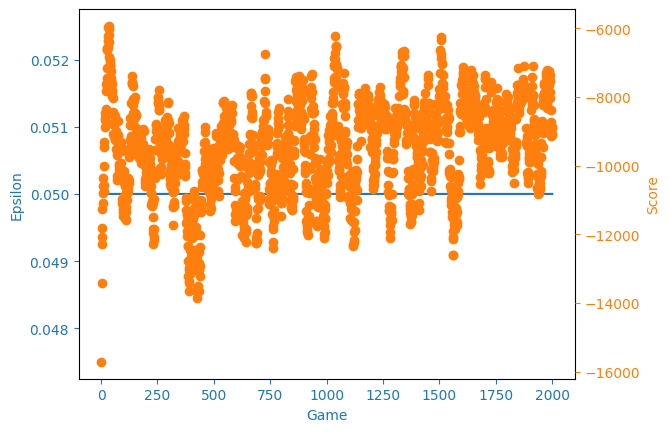

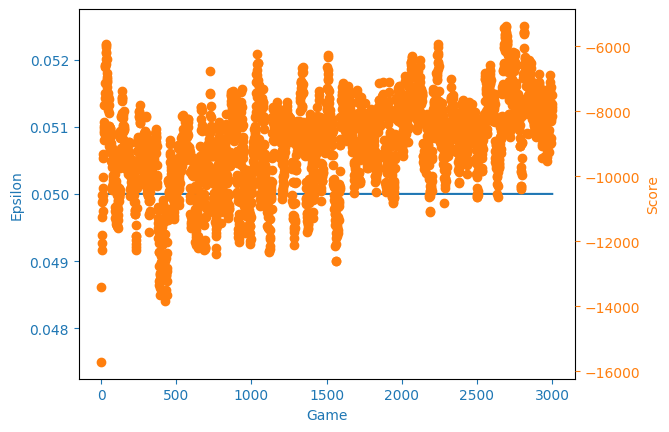

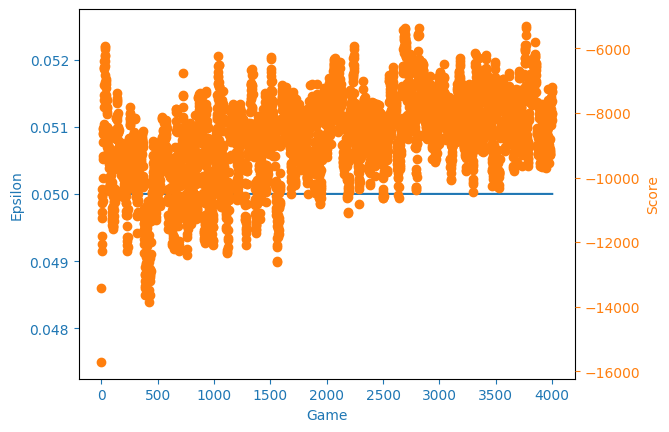

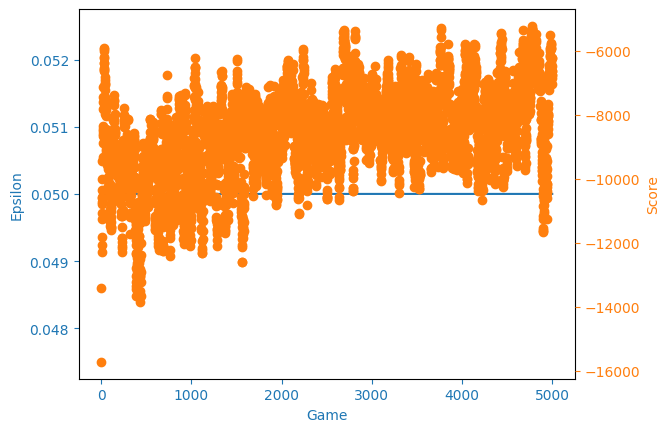

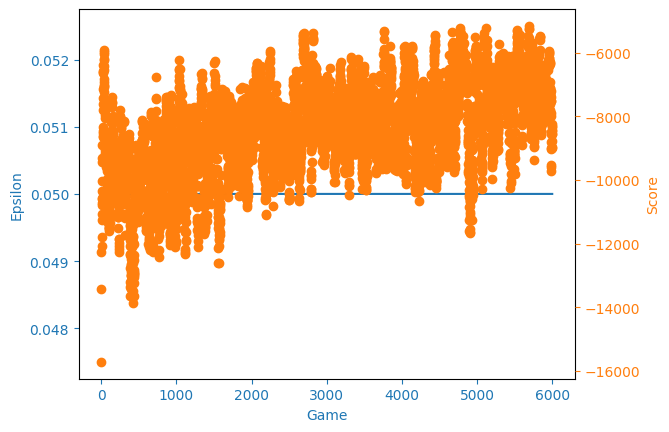

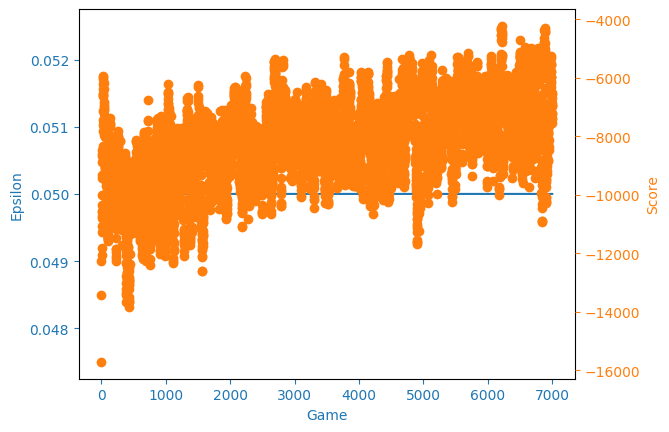

In [29]:
agent = train_model('humvee_largestt_7', 'humvee_largestt_6.h5')
agent.save_model()

In [ ]:
agent = train_model('humvee_largestt_7', 'humvee_largestt_6.h5')
agent.save_model()